In [1]:
%matplotlib inline
import os
import cv2
import random
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt

## 데이터 구성
### vol1. market dataset 랜덤
#### data(128, 64)

In [ ]:
path_dir = '/home/esdl/tensorflow/Market-1501-v15.09.15/bounding_box_train'
file_list = os.listdir(path_dir)
file_list.sort()

list_len = len(file_list)
print("이미지 파일 총 갯수 : ",list_len)

file_list_random = list(range(list_len))
random.shuffle(file_list_random)

data1=[]
data2=[]
CoN=[] # correct[0 1] or not[1 0]

#--- 같은 사람들 묶음

pick_num = 10# 같은사람당 뽑을 묶음 수
saved_name = file_list[0][:4]
front = 0
back = 0
for index, img_name in enumerate(file_list):
    if img_name[:4] == saved_name:
        continue
    
    saved_name = img_name[:4]
    back = index
    for i in range(pick_num):
        D1,D2 = random.sample(range(front,back),2)
        data1.append(D1)
        data2.append(D2)
        CoN.append([0,1])
    
    front = index

#--- 다른 사람들 묶음

for index in range(0,list_len,2):
    D1 = file_list_random[index]
    D2 = file_list_random[index+1]
    data1.append(D1)
    data2.append(D2)
    if file_list[D1][:4] == file_list[D2][:4]:
        CoN.append([0,1])
    else:
        CoN.append([1,0])

CoN=np.asarray(CoN)


data_index = list(range(len(data1)))
random.shuffle(data_index)

nsp, sp = np.sum(CoN,axis=0)
print("같은사람 : ",sp)
print("다른사람 : ",nsp)

for i in data_index[:10]:
    img1 = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",file_list[data1[i]])
    print("second pic = ",file_list[data2[i]])
    print("answer is = ",CoN[i])
    plt.show()
    plt.close(fig)

### vol2. market dataset 단순화

In [ ]:
path_dir = '/home/esdl/tensorflow/Market-1501-v15.09.15/S_dataset'
p_list = os.listdir(path_dir)
p_list.sort()

file_list=p_list
list_len = len(p_list)

data1=[]
data2=[]
CoN=[] # correct[1] or not[0]

#--- 사람들 묶음 제작

pick_num = 5# 뽑을 묶음 수
saved_name = p_list[0][:4]
front = 0
back = 0
for index, img_name in enumerate(p_list):
    if img_name[:4] == saved_name and index+1 != len(p_list):
        continue
    saved_name = img_name[:4]
    back = index
    for i in range(pick_num):
        D1,D2 = random.sample(range(front,back),2)
        data1.append(D1)
        data2.append(D2)
        CoN.append([0,1])
    for i in range(pick_num):
        D1 = random.sample(range(front,back),1)
        if index+1 == len(p_list):
            D2 = random.sample(range(0,front),1)
        else:
            D2 = random.sample(range(back,len(p_list)),1)
        data1.extend(D1)
        data2.extend(D2)
        CoN.append([1,0])
    
    front = index

CoN=np.asarray(CoN)


for i in range(len(data1)):
    print(p_list[data1[i]],p_list[data2[i]])
data_index = list(range(len(data1)))

img = cv2.imread(path_dir+'/'+file_list[data1[0]],cv2.IMREAD_COLOR)
print(img.shape[0])
print(img.shape[0])

for i in data_index[:10]:
    img1 = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",file_list[data1[i]])
    print("second pic = ",file_list[data2[i]])
    print("answer is = ",CoN[i])
    plt.show()
    plt.close(fig)

### vol3. cuhk03 dataset
#### data(160, 60)

이미지 파일 총 갯수 :  14097
같은사람 :  14670
다른사람 :  14670
first pic =  0000_06.jpg
second pic =  0000_04.jpg
answer is =  [0 1]


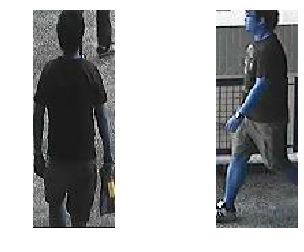

first pic =  0000_05.jpg
second pic =  0000_07.jpg
answer is =  [0 1]


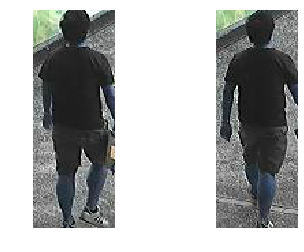

first pic =  0000_00.jpg
second pic =  0000_06.jpg
answer is =  [0 1]


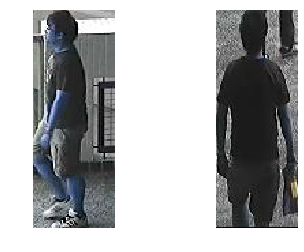

first pic =  0000_08.jpg
second pic =  0000_06.jpg
answer is =  [0 1]


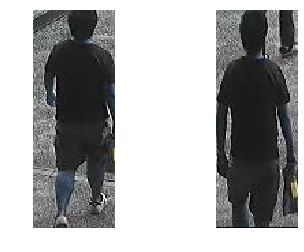

first pic =  0000_00.jpg
second pic =  0000_01.jpg
answer is =  [0 1]


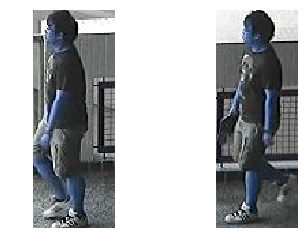

first pic =  0000_01.jpg
second pic =  0000_07.jpg
answer is =  [0 1]


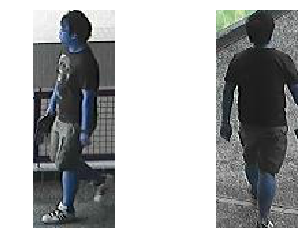

first pic =  0000_00.jpg
second pic =  0000_09.jpg
answer is =  [0 1]


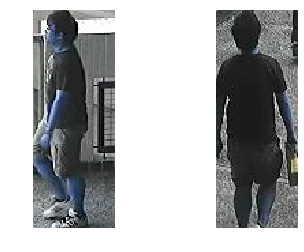

first pic =  0000_04.jpg
second pic =  0000_08.jpg
answer is =  [0 1]


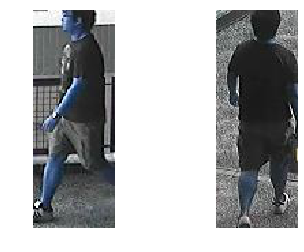

first pic =  0000_09.jpg
second pic =  0000_04.jpg
answer is =  [0 1]


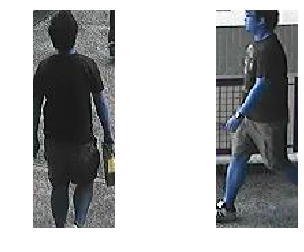

first pic =  0000_01.jpg
second pic =  0000_07.jpg
answer is =  [0 1]


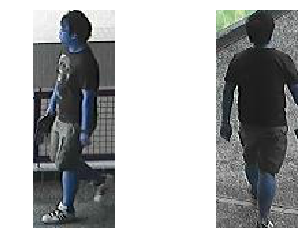

In [2]:
#path_dir = '/home/esdl/tensorflow/campus'
path_dir = '/home/esdl/tensorflow/cuhk03_release/images/detected'
p_list = os.listdir(path_dir)
p_list.sort()

file_list=p_list
list_len = len(p_list)
print("이미지 파일 총 갯수 : ",list_len)

data1=[]
data2=[]
CoN=[] # correct[1] or not[0]


#--- 사람들 묶음 제작

pick_num = 10# 뽑을 묶음 수
saved_name = p_list[0][:4]
front = 0
back = 0
for index, img_name in enumerate(p_list):
    if img_name[:4] == saved_name and index+1 != len(p_list):
        continue
    saved_name = img_name[:4]
    back = index
    for i in range(pick_num):
        D1,D2 = random.sample(range(front,back),2)
        data1.append(D1)
        data2.append(D2)
        CoN.append([0,1])
    for i in range(pick_num):
        D1 = random.sample(range(front,back),1)
        if index+1 == len(p_list):
            D2 = random.sample(range(0,front),1)
        else:
            D2 = random.sample(range(back,len(p_list)),1)
        data1.extend(D1)
        data2.extend(D2)
        CoN.append([1,0])
    
    front = index

CoN=np.asarray(CoN)

#---

data_index = list(range(len(data1)))

nsp, sp = np.sum(CoN,axis=0)
print("같은사람 : ",sp)
print("다른사람 : ",nsp)


for i in data_index[:10]:
    img1 = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",file_list[data1[i]])
    print("second pic = ",file_list[data2[i]])
    print("answer is = ",CoN[i])
    plt.show()
    plt.close(fig)

#### test 데이터 만들기... (campus dataset)

이미지 파일 총 갯수 :  3884
같은사람 :  9710
다른사람 :  9710
first pic =  0001001.png
second pic =  0001002.png
answer is =  [0 1]


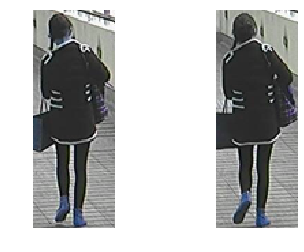

first pic =  0001001.png
second pic =  0001004.png
answer is =  [0 1]


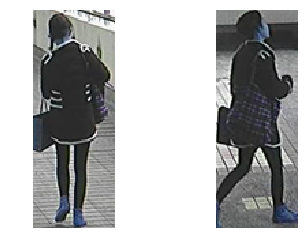

first pic =  0001004.png
second pic =  0001003.png
answer is =  [0 1]


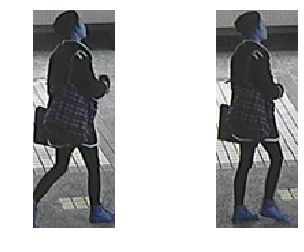

first pic =  0001003.png
second pic =  0001002.png
answer is =  [0 1]


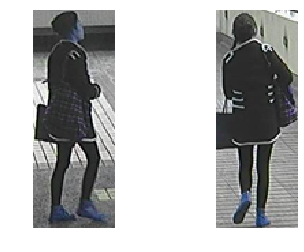

first pic =  0001003.png
second pic =  0001002.png
answer is =  [0 1]


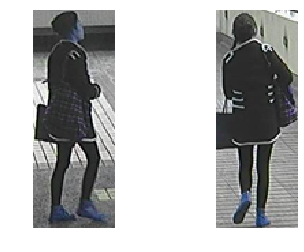

first pic =  0001001.png
second pic =  0001002.png
answer is =  [0 1]


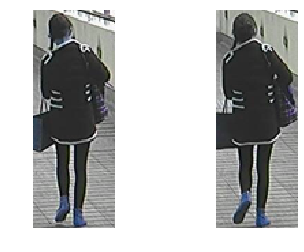

first pic =  0001002.png
second pic =  0001001.png
answer is =  [0 1]


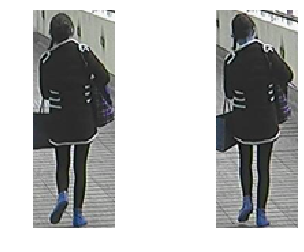

first pic =  0001004.png
second pic =  0001003.png
answer is =  [0 1]


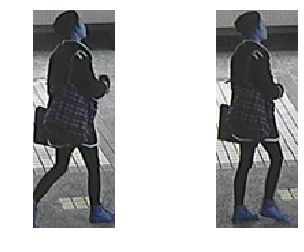

first pic =  0001001.png
second pic =  0001004.png
answer is =  [0 1]


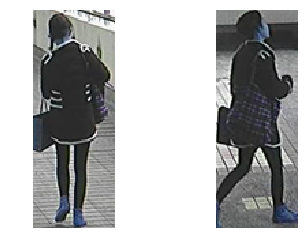

first pic =  0001002.png
second pic =  0001001.png
answer is =  [0 1]


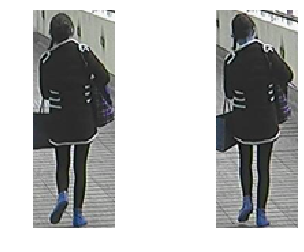

In [3]:
test_path_dir = '/home/esdl/tensorflow/campus'
#test_path_dir = '/home/esdl/tensorflow/cuhk03_release/images/detected'
p_list = os.listdir(test_path_dir)
p_list.sort()

list_len = len(p_list)
print("이미지 파일 총 갯수 : ",list_len)

test_data1=[]
test_data2=[]
test_CoN=[]

#--- 사람들 묶음 제작

pick_num = 10# 뽑을 묶음 수
saved_name = p_list[0][:4]
front = 0
back = 0
for index, img_name in enumerate(p_list):
    if img_name[:4] == saved_name and index+1 != len(p_list):
        continue
    saved_name = img_name[:4]
    back = index
    for i in range(pick_num):
        D1,D2 = random.sample(range(front,back),2)
        test_data1.append(D1)
        test_data2.append(D2)
        test_CoN.append([0,1])
    for i in range(pick_num):
        D1 = random.sample(range(front,back),1)
        if index+1 == len(p_list):
            D2 = random.sample(range(0,front),1)
        else:
            D2 = random.sample(range(back,len(p_list)),1)
        test_data1.extend(D1)
        test_data2.extend(D2)
        test_CoN.append([1,0])
    
    front = index

test_CoN=np.asarray(test_CoN)

#---

test_data_index = list(range(len(test_data1)))
random.shuffle(test_data_index)

nsp, sp = np.sum(test_CoN,axis=0)
print("같은사람 : ",sp)
print("다른사람 : ",nsp)


for i in data_index[:10]:
    img1 = cv2.imread(test_path_dir+'/'+p_list[test_data1[i]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(test_path_dir+'/'+p_list[test_data2[i]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",p_list[test_data1[i]])
    print("second pic = ",p_list[test_data2[i]])
    print("answer is = ",test_CoN[i])
    plt.show()
    plt.close(fig)

#### 데이터 만들기... (facedata)

In [ ]:
import re

path_dir = '/home/esdl/tensorflow/aderdeen'
p_list = os.listdir(path_dir)
p_list.sort()

list_len = len(p_list)
print("이미지 파일 총 갯수 : ",list_len)

data1=[]
data2=[]
CoN=[]

#--- 사람들 묶음 제작

pick_num = 5# 뽑을 묶음 수
saved_name = re.findall("[^0-9!]+",p_list[0])[0]
front = 0
back = 0
for index, img_name in enumerate(p_list):
    if img_name[:len(saved_name)] == saved_name and index+1 != len(p_list):
        continue
    saved_name = img_name[:len(saved_name)]
    back = index
    if back-front == 1:
        continue
    for i in range(pick_num):
        D1,D2 = random.sample(range(front,back),2)
        data1.append(D1)
        data2.append(D2)
        CoN.append([0,1])
    for i in range(pick_num):
        D1 = random.sample(range(front,back),1)
        if index+1 == len(p_list):
            D2 = random.sample(range(0,front),1)
        else:
            D2 = random.sample(range(back,len(p_list)),1)
        data1.extend(D1)
        data2.extend(D2)
        CoN.append([1,0])
    
    front = index

CoN=np.asarray(CoN)

#---

data_index = list(range(len(data1)))
#random.shuffle(data_index)

nsp, sp = np.sum(CoN,axis=0)
print("같은사람 : ",sp)
print("다른사람 : ",nsp)


for i in data_index[:10]:
    img1 = cv2.imread(path_dir+'/'+p_list[data1[i]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+p_list[data2[i]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",p_list[data1[i]])
    print("second pic = ",p_list[data2[i]])
    print("answer is = ",CoN[i])
    plt.show()
    plt.close(fig)

## Cross neighborhood difference 함수 구현

In [4]:
def CrossND (input1, input2, stride = 3):
    # padding stride 미적용 일단 3으로 할 것
    L = len(input1.shape)
    if L==2: print("3차원 이상만 가능합니다.")
    elif L==3: paddings = tf.constant([[0, 0], [1, 1], [1, 1]])
    elif L==4: paddings = tf.constant([[0, 0], [0, 0], [1, 1], [1, 1]])
    else: print("미구현됨...")
        
    input2 = tf.pad(input2, paddings, "CONSTANT")
    for i in range(input1.shape[L-2]):
        if L==3: F1 = tf.subtract(tf.reshape(input1[:,i,0],[input1.shape[L-3],1,1]),input2[:,i:i+stride,:stride])
        elif L==4: F1 = tf.subtract(tf.reshape(input1[:,:,i,0],[-1,input1.shape[L-3],1,1]),input2[:,:,i:i+stride,:stride])
        for j in range(input1.shape[L-1]):
            if j == 0: continue
            if L==3: F2 = tf.subtract(tf.reshape(input1[:,i,j],[input1.shape[L-3],1,1]),input2[:,i:i+stride,j:j+stride])
            elif L==4: F2 = tf.subtract(tf.reshape(input1[:,:,i,j],[-1,input1.shape[L-3],1,1]),input2[:,:,i:i+stride,j:j+stride])
            F1 = tf.concat([F1,F2],L-1)
        if i==0:
            output = F1
            continue
        output = tf.concat([output,F1],L-2)
    return output

In [ ]:
def inception2d(x, in_channels, filter_count):
    # bias dimension = 3*filter_count and then the extra in_channels for the avg pooling
    bias = tf.Variable(tf.truncated_normal([3*filter_count + in_channels], mu, sigma)),

    # 1x1
    one_filter = tf.Variable(tf.truncated_normal([1, 1, in_channels, filter_count], mu, sigma))
    one_by_one = tf.nn.conv2d(x, one_filter, strides=[1, 1, 1, 1], padding='SAME')

    # 3x3
    three_filter = tf.Variable(tf.truncated_normal([3, 3, in_channels, filter_count], mu, sigma))
    three_by_three = tf.nn.conv2d(x, three_filter, strides=[1, 1, 1, 1], padding='SAME')

    # 5x5
    five_filter = tf.Variable(tf.truncated_normal([5, 5, in_channels, filter_count], mu, sigma))
    five_by_five = tf.nn.conv2d(x, five_filter, strides=[1, 1, 1, 1], padding='SAME')

    # avg pooling
    pooling = tf.nn.avg_pool(x, ksize=[1, 3, 3, 1], strides=[1, 1, 1, 1], padding='SAME')

    x = tf.concat([one_by_one, three_by_three, five_by_five, pooling], axis=3)  # Concat in the 4th dim to stack
    x = tf.nn.bias_add(x, bias)
    return tf.nn.relu(x)

## 신경망 구성
### vol.1

In [ ]:
X1 = tf.placeholder(tf.float32, [None, 128, 64, 3]) # input image 1
X2 = tf.placeholder(tf.float32, [None, 128, 64, 3]) # input image 2
Y = tf.placeholder(tf.float32, [None, 2]) # output : different = [1 0] / same = [0 1]

#----------------------------------------------------- conv net
W1 = tf.Variable(tf.random_normal([10,10,3,64], stddev = 0.01))
W2 = tf.Variable(tf.random_normal([7,7,64,128], stddev = 0.01))
W3 = tf.Variable(tf.random_normal([4,4,128,128], stddev = 0.01))
W4 = tf.Variable(tf.random_normal([4,4,128,256], stddev = 0.01))
b1 = tf.Variable(tf.random_normal([1,1,64], mean = 0.5, stddev = 0.01))
b2 = tf.Variable(tf.random_normal([1,1,128], mean = 0.5, stddev = 0.01))
b3 = tf.Variable(tf.random_normal([1,1,128], mean = 0.5, stddev = 0.01))
b4 = tf.Variable(tf.random_normal([1,1,256], mean = 0.5, stddev = 0.01))

L1_1 = tf.nn.conv2d(X1,W1,strides=[1,1,1,1],padding='SAME')
L1_1 = tf.add(L1_1,b1)
L1_1 = tf.nn.relu(L1_1)
L1_1 = tf.nn.max_pool(L1_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L1_2 = tf.nn.conv2d(X2,W1,strides=[1,1,1,1],padding='SAME')
L1_2 = tf.add(L1_2,b1)
L1_2 = tf.nn.relu(L1_2)
L1_2 = tf.nn.max_pool(L1_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L1_1,'\n',L1_2)
L2_1 = tf.nn.conv2d(L1_1,W2,strides=[1,1,1,1],padding='SAME')
L2_1 = tf.add(L2_1,b2)
L2_1 = tf.nn.relu(L2_1)
L2_1 = tf.nn.max_pool(L2_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L2_2 = tf.nn.conv2d(L1_2,W2,strides=[1,1,1,1],padding='SAME')
L2_2 = tf.add(L2_2,b2)
L2_2 = tf.nn.relu(L2_2)
L2_2 = tf.nn.max_pool(L2_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L2_1,'\n',L2_2)
L3_1 = tf.nn.conv2d(L2_1,W3,strides=[1,1,1,1],padding='SAME')
L3_1 = tf.add(L3_1,b3)
L3_1 = tf.nn.relu(L3_1)
L3_1 = tf.nn.max_pool(L3_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L3_2 = tf.nn.conv2d(L2_2,W3,strides=[1,1,1,1],padding='SAME')
L3_2 = tf.add(L3_2,b3)
L3_2 = tf.nn.relu(L3_2)
L3_2 = tf.nn.max_pool(L3_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L3_1,'\n',L3_2)
L4_1 = tf.nn.conv2d(L3_1,W4,strides=[1,1,1,1],padding='SAME')
L4_1 = tf.add(L4_1,b4)
L4_1 = tf.nn.relu(L4_1)
L4_1 = tf.nn.max_pool(L4_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L4_2 = tf.nn.conv2d(L3_2,W4,strides=[1,1,1,1],padding='SAME')
L4_2 = tf.add(L4_2,b4)
L4_2 = tf.nn.relu(L4_2)
L4_2 = tf.nn.max_pool(L4_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L4_1,'\n',L4_2)

#----------------------------------------------------- cross neighborhood difference
L4_1 = tf.transpose(L4_1,[0,3,1,2])
L4_2 = tf.transpose(L4_2,[0,3,1,2])
L4 = CrossND(L4_1,L4_2)
L4 = tf.transpose(L4,[0,2,3,1])
print(L4)

#----------------------------------------------------- conv net
W5 = tf.Variable(tf.random_normal([4,4,256,256], stddev = 0.01))
b5 = tf.Variable(tf.random_normal([1,1,256], mean = 0.5, stddev = 0.01))

L5 = tf.nn.conv2d(L4,W5,strides=[1,3,3,1], padding = 'VALID')
L5 = tf.add(L5,b5)
L5 = tf.nn.relu(L5)
L5 = tf.nn.max_pool(L5, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L5)

#----------------------------------------------------- dense
W6 = tf.Variable(tf.random_normal([4*2*256,4096], stddev = 0.2))
W7 = tf.Variable(tf.random_normal([4096,512], stddev = 0.2))
W8 = tf.Variable(tf.random_normal([512,2], stddev = 0.2))
b6 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b7 = tf.Variable(tf.random_normal([512], mean = 0.5, stddev = 0.01))
b8 = tf.Variable(tf.random_normal([2], mean = 0.5, stddev = 0.01))

L6 = tf.reshape(L5, [-1,4*2*256])
L6 = tf.add(tf.matmul(L6,W6),b6)
L6 = tf.nn.sigmoid(L6)
print(L6)

L7 = tf.add(tf.matmul(L6,W7),b7)
L7 = tf.nn.sigmoid(L7)
print(L7)

model = tf.add(tf.matmul(L7,W8),b8)
print(model)

#-----------------------------------------------------

batch_size=50
total_batch=int(len(data_index) / batch_size)
print("전체 데이터 크기는",len(data_index),"배치 크기는",batch_size,"전체 배치는",total_batch)

cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(labels=Y, logits=model))

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 0.00006
#learning_rate = starter_learning_rate
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step,
#                                           total_batch, 0.99, staircase=True)

# optimizer = tf.train.AdamOptimizer(0.00006).minimize(cost)
# optimizer = tf.train.GradientDescentOptimizer(learning_rate = 0.00006).minimize(cost)
optimizer = tf.train.RMSPropOptimizer(0.00006).minimize(cost)

init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

for epoch in range(50):
    total_cost=0
    index_num=0
    for i in range(total_batch):
        
        input_data1 = np.empty((batch_size, 128, 64, 3))
        input_data2 = np.empty((batch_size, 128, 64, 3))
        batch_i=0
        for index_num in data_index[i*batch_size:(i+1)*batch_size]:
            input_data1[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[index_num]],cv2.IMREAD_COLOR)
            input_data2[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[index_num]],cv2.IMREAD_COLOR)
            batch_i=batch_i+1
        batch_xs1 = input_data1
        batch_xs1 = batch_xs1.reshape(-1,128,64,3)
        batch_xs2 = input_data2
        batch_xs2 = batch_xs2.reshape(-1,128,64,3)
        batch_ys = CoN[i*batch_size : (i+1)*batch_size]
        _, cost_val=sess.run([optimizer, cost], feed_dict={X1:batch_xs1, X2:batch_xs2, Y:batch_ys})
        total_cost += cost_val
    print('Epoch:', '%04d' % (epoch + 1), 'Avg.cost=', '{:.3f}'.format(total_cost / total_batch))
    
    if (epoch+1)%10 == 0:
        test_size=10
        is_correct=tf.equal(tf.argmax(tf.nn.softmax(model),1),tf.argmax(Y,1))
        accuracy=tf.reduce_mean(tf.cast(is_correct, tf.float32))
        test_data1 = np.empty((test_size, 128, 64,3))
        test_data2 = np.empty((test_size, 128, 64,3))
        for i in range(test_size):
            test_data1[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
            test_data2[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)

        test_data1 = test_data1.reshape(-1,128,64,3)
        test_data2 = test_data2.reshape(-1,128,64,3)
        ac = sess.run(accuracy, feed_dict={X1:test_data1,
                                            X2:test_data2,
                                            Y:CoN[data_index[:test_size]]})
        print('정확도:', ac)


    
print('Optimized!')


### vol.2

In [ ]:
data_x_size = 160
data_y_size = 60

X1 = tf.placeholder(tf.float32, [None, data_x_size, data_y_size, 3]) # input image 1
X2 = tf.placeholder(tf.float32, [None, data_x_size, data_y_size, 3]) # input image 2
Y = tf.placeholder(tf.float32, [None, 2]) # output : different = [1 0] / same = [0 1]

#----------------------------------------------------- conv net
W1 = tf.Variable(tf.random_normal([3,3,3,32], stddev = 0.01))
W2 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
W3 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
b1 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))
b2 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))
b3 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))

L1_1 = tf.nn.conv2d(X1,W1,strides=[1,1,1,1],padding='SAME')
L1_1 = tf.add(L1_1,b1)
L1_1 = tf.nn.relu(L1_1)
L1_1 = tf.nn.max_pool(L1_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L1_2 = tf.nn.conv2d(X2,W1,strides=[1,1,1,1],padding='SAME')
L1_2 = tf.add(L1_2,b1)
L1_2 = tf.nn.relu(L1_2)
L1_2 = tf.nn.max_pool(L1_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L1_1,'\n',L1_2)
L2_1 = tf.nn.conv2d(L1_1,W2,strides=[1,1,1,1],padding='SAME')
L2_1 = tf.add(L2_1,b2)
L2_1 = tf.nn.relu(L2_1)
L2_1 = tf.nn.max_pool(L2_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L2_2 = tf.nn.conv2d(L1_2,W2,strides=[1,1,1,1],padding='SAME')
L2_2 = tf.add(L2_2,b2)
L2_2 = tf.nn.relu(L2_2)
L2_2 = tf.nn.max_pool(L2_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L2_1,'\n',L2_2)
L3_1 = tf.nn.conv2d(L2_1,W3,strides=[1,1,1,1],padding='SAME')
L3_1 = tf.add(L3_1,b3)
L3_1 = tf.nn.relu(L3_1)
L3_1 = tf.nn.max_pool(L3_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L3_2 = tf.nn.conv2d(L2_2,W3,strides=[1,1,1,1],padding='SAME')
L3_2 = tf.add(L3_2,b3)
L3_2 = tf.nn.relu(L3_2)
L3_2 = tf.nn.max_pool(L3_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L3_1,'\n',L3_2)

L4_1=L3_1
L4_2=L3_2
#print(L4_1,'\n',L4_2)

#----------------------------------------------------- cross neighborhood difference
L4_1 = tf.transpose(L4_1,[0,3,1,2])
L4_2 = tf.transpose(L4_2,[0,3,1,2])
L4 = CrossND(L4_1,L4_2)
L4 = tf.transpose(L4,[0,2,3,1])
L4 = tf.nn.relu(L4)
print(L4)

#----------------------------------------------------- conv net
W5 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
b5 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))

L5 = tf.nn.conv2d(L4,W5,strides=[1,3,3,1], padding = 'VALID')
L5 = tf.add(L5,b5)
L5 = tf.nn.relu(L5)
L5 = tf.nn.max_pool(L5, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L5)

#----------------------------------------------------- dense
W6 = tf.Variable(tf.random_normal([10*4*32,4096], stddev = 0.2))
W7 = tf.Variable(tf.random_normal([4096,4096], stddev = 0.2))
W8 = tf.Variable(tf.random_normal([4096,512], stddev = 0.2))
W9 = tf.Variable(tf.random_normal([512,2], stddev = 0.2))

b6 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b7 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b8 = tf.Variable(tf.random_normal([512], mean = 0.5, stddev = 0.01))
b9 = tf.Variable(tf.random_normal([2], mean = 0.5, stddev = 0.01))

L6 = tf.reshape(L5, [-1,10*4*32])
L6 = tf.add(tf.matmul(L6,W6),b6)
L6 = tf.nn.sigmoid(L6)
print(L6)

L7 = tf.add(tf.matmul(L6,W7),b7)
L7 = tf.nn.sigmoid(L7)
print(L7)

L8 = tf.add(tf.matmul(L7,W8),b8)
L8 = tf.nn.sigmoid(L8)
print(L8)

model = tf.add(tf.matmul(L8,W9),b9)
print(model)

#-----------------------------------------------------

batch_size=100
total_batch=int(len(data_index) / batch_size)
print("전체 데이터 크기는",len(data_index),"배치 크기는",batch_size,"전체 배치는",total_batch)

cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(labels=Y, logits=model))

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 0.00006
#learning_rate = starter_learning_rate
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step,
#                                           total_batch, 0.99, staircase=True)

# optimizer = tf.train.AdamOptimizer(0.00006).minimize(cost)
# optimizer = tf.train.GradientDescentOptimizer(learning_rate = 0.00006).minimize(cost)
optimizer = tf.train.RMSPropOptimizer(0.00006).minimize(cost)

init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

for epoch in range(200):
    total_cost=0
    index_num=0
    for i in range(total_batch):
        
        input_data1 = np.empty((batch_size, data_x_size, data_y_size, 3))
        input_data2 = np.empty((batch_size, data_x_size, data_y_size, 3))
        batch_i=0
        for index_num in data_index[i*batch_size:(i+1)*batch_size]:
            input_data1[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[index_num]],cv2.IMREAD_COLOR)
            input_data2[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[index_num]],cv2.IMREAD_COLOR)
            batch_i=batch_i+1
        batch_xs1 = input_data1
        batch_xs1 = batch_xs1.reshape(-1,data_x_size,data_y_size,3)
        batch_xs2 = input_data2
        batch_xs2 = batch_xs2.reshape(-1,data_x_size,data_y_size,3)
        batch_ys = CoN[i*batch_size : (i+1)*batch_size]
        _, cost_val=sess.run([optimizer, cost], feed_dict={X1:batch_xs1, X2:batch_xs2, Y:batch_ys})
        total_cost += cost_val
    print('Epoch:', '%04d' % (epoch + 1), 'Avg.cost=', '{:.3f}'.format(total_cost / total_batch))
    
    if (epoch+1)%10 == 0:
        test_size=50
        is_correct=tf.equal(tf.argmax(tf.nn.softmax(model),1),tf.argmax(Y,1))
        accuracy=tf.reduce_mean(tf.cast(is_correct, tf.float32))
        test_data1 = np.empty((test_size, data_x_size, data_y_size,3))
        test_data2 = np.empty((test_size, data_x_size, data_y_size,3))
        for i in range(test_size):
            test_data1[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
            test_data2[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)

        test_data1 = test_data1.reshape(-1,data_x_size,data_y_size,3)
        test_data2 = test_data2.reshape(-1,data_x_size,data_y_size,3)
        ac = sess.run(accuracy, feed_dict={X1:test_data1,
                                            X2:test_data2,
                                            Y:CoN[:test_size]})
        print('정확도:', ac)


    
print('Optimized!')


### vol.3

In [5]:
data_x_size = 160
data_y_size = 60

X1 = tf.placeholder(tf.float32, [None, data_x_size, data_y_size, 3]) # input image 1
X2 = tf.placeholder(tf.float32, [None, data_x_size, data_y_size, 3]) # input image 2
Y = tf.placeholder(tf.float32, [None, 2]) # output : different = [1 0] / same = [0 1]

#----------------------------------------------------- conv net
W1 = tf.Variable(tf.random_normal([3,3,3,32], stddev = 0.01))
W2 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
W3 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
b1 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))
b2 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))
b3 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))

L1_1 = tf.nn.conv2d(X1,W1,strides=[1,1,1,1],padding='SAME')
L1_1 = tf.add(L1_1,b1)
L1_1 = tf.nn.relu(L1_1)
L1_1 = tf.nn.max_pool(L1_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L1_2 = tf.nn.conv2d(X2,W1,strides=[1,1,1,1],padding='SAME')
L1_2 = tf.add(L1_2,b1)
L1_2 = tf.nn.relu(L1_2)
L1_2 = tf.nn.max_pool(L1_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L1_1,'\n',L1_2)
L2_1 = tf.nn.conv2d(L1_1,W2,strides=[1,1,1,1],padding='SAME')
L2_1 = tf.add(L2_1,b2)
L2_1 = tf.nn.relu(L2_1)
L2_1 = tf.nn.max_pool(L2_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L2_2 = tf.nn.conv2d(L1_2,W2,strides=[1,1,1,1],padding='SAME')
L2_2 = tf.add(L2_2,b2)
L2_2 = tf.nn.relu(L2_2)
L2_2 = tf.nn.max_pool(L2_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L2_1,'\n',L2_2)
L3_1 = tf.nn.conv2d(L2_1,W3,strides=[1,1,1,1],padding='SAME')
L3_1 = tf.add(L3_1,b3)
L3_1 = tf.nn.relu(L3_1)
L3_1 = tf.nn.max_pool(L3_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L3_2 = tf.nn.conv2d(L2_2,W3,strides=[1,1,1,1],padding='SAME')
L3_2 = tf.add(L3_2,b3)
L3_2 = tf.nn.relu(L3_2)
L3_2 = tf.nn.max_pool(L3_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L3_1,'\n',L3_2)

L4_1=L3_1
L4_2=L3_2
#print(L4_1,'\n',L4_2)

#----------------------------------------------------- cross neighborhood difference
L4_1 = tf.transpose(L4_1,[0,3,1,2])
L4_2 = tf.transpose(L4_2,[0,3,1,2])
L4 = CrossND(L4_1,L4_2)
L4 = tf.transpose(L4,[0,2,3,1])
L4 = tf.nn.relu(L4)
print(L4)

#----------------------------------------------------- conv net
W5 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
b5 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))

L5 = tf.nn.conv2d(L4,W5,strides=[1,3,3,1], padding = 'VALID')
L5 = tf.add(L5,b5)
L5 = tf.nn.relu(L5)
L5 = tf.nn.max_pool(L5, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L5)

#----------------------------------------------------- dense
W6 = tf.Variable(tf.random_normal([10*4*32,4096], stddev = 0.2))
W7 = tf.Variable(tf.random_normal([4096,4096], stddev = 0.2))
W8 = tf.Variable(tf.random_normal([4096,512], stddev = 0.2))
W9 = tf.Variable(tf.random_normal([512,2], stddev = 0.2))

b6 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b7 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b8 = tf.Variable(tf.random_normal([512], mean = 0.5, stddev = 0.01))
b9 = tf.Variable(tf.random_normal([2], mean = 0.5, stddev = 0.01))

L6 = tf.reshape(L5, [-1,10*4*32])
L6 = tf.add(tf.matmul(L6,W6),b6)
L6 = tf.nn.sigmoid(L6)
print(L6)

L7 = tf.add(tf.matmul(L6,W7),b7)
L7 = tf.nn.sigmoid(L7)
print(L7)

L8 = tf.add(tf.matmul(L7,W8),b8)
L8 = tf.nn.sigmoid(L8)
print(L8)

model = tf.add(tf.matmul(L8,W9),b9)
print(model)

#-----------------------------------------------------

batch_size=100
total_batch=int(len(data_index) / batch_size)
print("전체 데이터 크기는",len(data_index),"배치 크기는",batch_size,"전체 배치는",total_batch)

cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(labels=Y, logits=model))

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 0.00006
#learning_rate = starter_learning_rate
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step,
#                                           total_batch, 0.99, staircase=True)

# optimizer = tf.train.AdamOptimizer(0.00006).minimize(cost)
# optimizer = tf.train.GradientDescentOptimizer(learning_rate = 0.00006).minimize(cost)
optimizer = tf.train.RMSPropOptimizer(0.00006).minimize(cost)

init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

for epoch in range(200):
    total_cost=0
    index_num=0
    for i in range(total_batch):
        
        input_data1 = np.empty((batch_size, data_x_size, data_y_size, 3))
        input_data2 = np.empty((batch_size, data_x_size, data_y_size, 3))
        batch_i=0
        for index_num in data_index[i*batch_size:(i+1)*batch_size]:
            input_data1[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[index_num]],cv2.IMREAD_COLOR)
            input_data2[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[index_num]],cv2.IMREAD_COLOR)
            batch_i=batch_i+1
        batch_xs1 = input_data1
        batch_xs1 = batch_xs1.reshape(-1,data_x_size,data_y_size,3)
        batch_xs2 = input_data2
        batch_xs2 = batch_xs2.reshape(-1,data_x_size,data_y_size,3)
        batch_ys = CoN[i*batch_size : (i+1)*batch_size]
        _, cost_val=sess.run([optimizer, cost], feed_dict={X1:batch_xs1, X2:batch_xs2, Y:batch_ys})
        total_cost += cost_val
    print('Epoch:', '%04d' % (epoch + 1), 'Avg.cost=', '{:.3f}'.format(total_cost / total_batch))
    
    if (epoch+1)%10 == 0:
        test_size=100
        is_correct=tf.equal(tf.argmax(tf.nn.softmax(model),1),tf.argmax(Y,1))
        accuracy=tf.reduce_mean(tf.cast(is_correct, tf.float32))
        test_img1 = np.empty((test_size, data_x_size, data_y_size,3))
        test_img2 = np.empty((test_size, data_x_size, data_y_size,3))
        for i in range(test_size):
            test_img1[i,:,:,:] = cv2.imread(test_path_dir+'/'+p_list[test_data1[test_data_index[i]]],cv2.IMREAD_COLOR)
            test_img2[i,:,:,:] = cv2.imread(test_path_dir+'/'+p_list[test_data2[test_data_index[i]]],cv2.IMREAD_COLOR)

        test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
        test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
        ac = sess.run(accuracy, feed_dict={X1:test_img1,
                                            X2:test_img2,
                                            Y:test_CoN[test_data_index[:test_size]]})
        print('정확도:', ac)


    
print('Optimized!')


Tensor("MaxPool:0", shape=(?, 80, 30, 32), dtype=float32) 
 Tensor("MaxPool_1:0", shape=(?, 80, 30, 32), dtype=float32)
Tensor("MaxPool_2:0", shape=(?, 40, 15, 32), dtype=float32) 
 Tensor("MaxPool_3:0", shape=(?, 40, 15, 32), dtype=float32)
Tensor("MaxPool_4:0", shape=(?, 20, 8, 32), dtype=float32) 
 Tensor("MaxPool_5:0", shape=(?, 20, 8, 32), dtype=float32)
Tensor("Relu_6:0", shape=(?, 60, 24, 32), dtype=float32)
Tensor("MaxPool_6:0", shape=(?, 10, 4, 32), dtype=float32)
Tensor("Sigmoid:0", shape=(?, 4096), dtype=float32)
Tensor("Sigmoid_1:0", shape=(?, 4096), dtype=float32)
Tensor("Sigmoid_2:0", shape=(?, 512), dtype=float32)
Tensor("Add_10:0", shape=(?, 2), dtype=float32)
전체 데이터 크기는 29340 배치 크기는 100 전체 배치는 293
Epoch: 0001 Avg.cost= 0.705
Epoch: 0002 Avg.cost= 0.612
Epoch: 0003 Avg.cost= 0.560
Epoch: 0004 Avg.cost= 0.522
Epoch: 0005 Avg.cost= 0.484
Epoch: 0006 Avg.cost= 0.457
Epoch: 0007 Avg.cost= 0.427
Epoch: 0008 Avg.cost= 0.400
Epoch: 0009 Avg.cost= 0.381
Epoch: 0010 Avg.cost= 0.

KeyboardInterrupt: 

### Vol.4

In [ ]:
data_x_size = 300
data_y_size = 300

X1 = tf.placeholder(tf.float32, [None, data_x_size, data_y_size, 3]) # input image 1
X2 = tf.placeholder(tf.float32, [None, data_x_size, data_y_size, 3]) # input image 2
Y = tf.placeholder(tf.float32, [None, 2]) # output : different = [1 0] / same = [0 1]

#----------------------------------------------------- conv net
W1 = tf.Variable(tf.random_normal([3,3,3,32], stddev = 0.01))
W2 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
W3 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
b1 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))
b2 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))
b3 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))

L1_1 = tf.nn.conv2d(X1,W1,strides=[1,1,1,1],padding='SAME')
L1_1 = tf.add(L1_1,b1)
L1_1 = tf.nn.relu(L1_1)
L1_1 = tf.nn.max_pool(L1_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L1_2 = tf.nn.conv2d(X2,W1,strides=[1,1,1,1],padding='SAME')
L1_2 = tf.add(L1_2,b1)
L1_2 = tf.nn.relu(L1_2)
L1_2 = tf.nn.max_pool(L1_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L1_1,'\n',L1_2)
L2_1 = tf.nn.conv2d(L1_1,W2,strides=[1,1,1,1],padding='SAME')
L2_1 = tf.add(L2_1,b2)
L2_1 = tf.nn.relu(L2_1)
L2_1 = tf.nn.max_pool(L2_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L2_2 = tf.nn.conv2d(L1_2,W2,strides=[1,1,1,1],padding='SAME')
L2_2 = tf.add(L2_2,b2)
L2_2 = tf.nn.relu(L2_2)
L2_2 = tf.nn.max_pool(L2_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L2_1,'\n',L2_2)
L3_1 = tf.nn.conv2d(L2_1,W3,strides=[1,1,1,1],padding='SAME')
L3_1 = tf.add(L3_1,b3)
L3_1 = tf.nn.relu(L3_1)
L3_1 = tf.nn.max_pool(L3_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L3_2 = tf.nn.conv2d(L2_2,W3,strides=[1,1,1,1],padding='SAME')
L3_2 = tf.add(L3_2,b3)
L3_2 = tf.nn.relu(L3_2)
L3_2 = tf.nn.max_pool(L3_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L3_1,'\n',L3_2)

L4_1=L3_1
L4_2=L3_2
#print(L4_1,'\n',L4_2)

#----------------------------------------------------- cross neighborhood difference
L4_1 = tf.transpose(L4_1,[0,3,1,2])
L4_2 = tf.transpose(L4_2,[0,3,1,2])
L4 = CrossND(L4_1,L4_2)
L4 = tf.transpose(L4,[0,2,3,1])
L4 = tf.nn.relu(L4)
print(L4)

#----------------------------------------------------- conv net
W5 = tf.Variable(tf.random_normal([3,3,32,32], stddev = 0.01))
b5 = tf.Variable(tf.random_normal([1,1,32], mean = 0.5, stddev = 0.01))

L5 = tf.nn.conv2d(L4,W5,strides=[1,3,3,1], padding = 'VALID')
L5 = tf.add(L5,b5)
L5 = tf.nn.relu(L5)
L5 = tf.nn.max_pool(L5, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
print(L5)
print("완전연결 계층 시작")

#----------------------------------------------------- dense
W6 = tf.Variable(tf.random_normal([19*19*32,4096], stddev = 0.2))
W7 = tf.Variable(tf.random_normal([4096,4096], stddev = 0.2))
W8 = tf.Variable(tf.random_normal([4096,512], stddev = 0.2))
W9 = tf.Variable(tf.random_normal([512,2], stddev = 0.2))

b6 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b7 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))
b8 = tf.Variable(tf.random_normal([512], mean = 0.5, stddev = 0.01))
b9 = tf.Variable(tf.random_normal([2], mean = 0.5, stddev = 0.01))

L6 = tf.reshape(L5, [-1,19*19*32])
L6 = tf.add(tf.matmul(L6,W6),b6)
L6 = tf.nn.sigmoid(L6)
print(L6)

L7 = tf.add(tf.matmul(L6,W7),b7)
L7 = tf.nn.sigmoid(L7)
print(L7)

L8 = tf.add(tf.matmul(L7,W8),b8)
L8 = tf.nn.sigmoid(L8)
print(L8)

model = tf.add(tf.matmul(L8,W9),b9)
print(model)

#-----------------------------------------------------

batch_size=100
total_batch=int(len(data_index) / batch_size)
print("전체 데이터 크기는",len(data_index),"배치 크기는",batch_size,"전체 배치는",total_batch)

cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(labels=Y, logits=model))

#global_step = tf.Variable(0, trainable=False)
#starter_learning_rate = 0.00006
#learning_rate = starter_learning_rate
#learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step,
#                                           total_batch, 0.99, staircase=True)

# optimizer = tf.train.AdamOptimizer(0.00006).minimize(cost)
# optimizer = tf.train.GradientDescentOptimizer(learning_rate = 0.00006).minimize(cost)
optimizer = tf.train.RMSPropOptimizer(0.00006).minimize(cost)

init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

for epoch in range(200):
    total_cost=0
    index_num=0
    for i in range(total_batch):
        
        input_data1 = np.empty((batch_size, data_x_size, data_y_size, 3))
        input_data2 = np.empty((batch_size, data_x_size, data_y_size, 3))
        batch_i=0
        for index_num in data_index[i*batch_size:(i+1)*batch_size]:
            input_data1[batch_i,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+p_list[data1[index_num]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))
            input_data2[batch_i,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+p_list[data2[index_num]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))
            batch_i=batch_i+1
        batch_xs1 = input_data1
        batch_xs1 = batch_xs1.reshape(-1,data_x_size,data_y_size,3)
        batch_xs2 = input_data2
        batch_xs2 = batch_xs2.reshape(-1,data_x_size,data_y_size,3)
        batch_ys = CoN[i*batch_size : (i+1)*batch_size]
        _, cost_val=sess.run([optimizer, cost], feed_dict={X1:batch_xs1, X2:batch_xs2, Y:batch_ys})
        total_cost += cost_val
    print('Epoch:', '%04d' % (epoch + 1), 'Avg.cost=', '{:.3f}'.format(total_cost / total_batch))
    
    if (epoch+1)%10 == 0:
        test_size=100
        is_correct=tf.equal(tf.argmax(tf.nn.softmax(model),1),tf.argmax(Y,1))
        accuracy=tf.reduce_mean(tf.cast(is_correct, tf.float32))
        test_img1 = np.empty((test_size, data_x_size, data_y_size,3))
        test_img2 = np.empty((test_size, data_x_size, data_y_size,3))
        for i in range(test_size):
            test_img1[i,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+p_list[data1[i]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))
            test_img2[i,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+p_list[data2[i]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))

        test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
        test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
        ac = sess.run(accuracy, feed_dict={X1:test_img1,
                                            X2:test_img2,
                                            Y:CoN[data_index[:test_size]]})
        print('정확도:', ac)


    
print('Optimized!')


# 신경망 성능 테스트 구역입니다.

### (128, 64)

In [ ]:
#test_size = len(data1)
test_size = 50
for i in range(test_size-1):
    test_data1 = np.empty((1, 128, 64,3))
    test_data2 = np.empty((1, 128, 64,3))
    test_data1[0,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
    test_data2[0,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[i+1]],cv2.IMREAD_COLOR)
    test_data1 = test_data1.reshape(-1,128,64,3)
    test_data2 = test_data2.reshape(-1,128,64,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_data1, X2:test_data2,})
    print(answer)
    img1 = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+file_list[data1[i+1]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",file_list[data1[i]])
    print("second pic = ",file_list[data1[i+1]])
    #print("answer is = ",CoN[i])
    if answer[0,0] < answer[0,1]:
         print("NN answer is = SAME")
    else:
        print("NN answer is = Different")
    plt.show()
    plt.close(fig)

In [ ]:
#test_size = len(data1)
test_size = 50
test_accuracy = []
for i in range(test_size):
    test_data1 = np.empty((1, 128, 64,3))
    test_data2 = np.empty((1, 128, 64,3))
    test_data1[0,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[data_index[i]]],cv2.IMREAD_COLOR)
    test_data2[0,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[data_index[i]]],cv2.IMREAD_COLOR)
    test_data1 = test_data1.reshape(-1,128,64,3)
    test_data2 = test_data2.reshape(-1,128,64,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_data1, X2:test_data2,})
    print(answer)
    img1 = cv2.imread(path_dir+'/'+file_list[data1[data_index[i]]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+file_list[data2[data_index[i]]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    print("first pic = ",file_list[data1[data_index[i]]])
    print("second pic = ",file_list[data2[data_index[i]]])
    print("answer is = ",CoN[data_index[i]])
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
        test_accuracy.append(CoN[data_index[i]][1])
    else:
        print("NN answer is = Different")
        test_accuracy.append(CoN[data_index[i]][0])
    plt.show()
    plt.close(fig)
print("정확도는 = ",sum(test_accuracy)/len(test_accuracy))

In [ ]:
data_x_size = 160
data_y_size = 60
list_len = len(file_list)

test_dataset = []
#--- 같은 사람들 묶음

saved_name = file_list[0][:4]
front = 0
back = 0
for index, img_name in enumerate(file_list):
    if img_name[:4] == saved_name:
        continue
    
    saved_name = img_name[:4]
    back = index
    if back-front <= 5:
        continue
        
    test_dataset.append(front)
    test_dataset.extend(random.sample(range(front+1,back),4))
    test_dataset.extend(random.sample(range(back,list_len+1),5))
    front = index
    
for i in range(10,500,10):
    rank = []
    rank_index = []
    img = np.empty((10, data_x_size, data_y_size, 3),dtype=int)
    
    for j in range(i-10,i):
        img[j%10,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+file_list[test_dataset[j]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))
        answer = sess.run(tf.sigmoid(model),feed_dict={X1:img[0].reshape(-1,data_x_size,data_y_size,3),
                                                       X2:img[j%10].reshape(-1,data_x_size,data_y_size,3)})
        rank.append(answer[0][1])
    rank_index = sorted(range(len(rank)), key=lambda k: rank[k])
    rank.sort(reverse = True) 
    print(rank)
    plt.imshow(img[0])
    plt.show()
    fig , ax = plt.subplots(1, 10)
    for j in range(10):
        ax[j].set_axis_off()
        ax[j].imshow(img[rank_index[9-j]])
        ax[j].set_title(j)
    plt.show()
    plt.close(fig)
    

### (160, 60)

[[2.5701395e-06 9.9999738e-01]]
first pic =  0000_01.jpg
second pic =  0000_00.jpg
answer is =  [0 1]
NN answer is = SAME


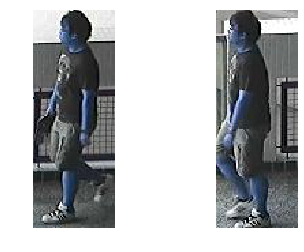

[[2.1142423e-05 9.9997890e-01]]
first pic =  0000_00.jpg
second pic =  0000_04.jpg
answer is =  [0 1]
NN answer is = SAME


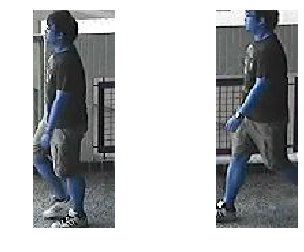

[[1.3756283e-05 9.9998629e-01]]
first pic =  0000_05.jpg
second pic =  0000_00.jpg
answer is =  [0 1]
NN answer is = SAME


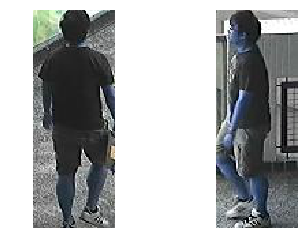

[[5.0015016e-05 9.9994993e-01]]
first pic =  0000_01.jpg
second pic =  0000_05.jpg
answer is =  [0 1]
NN answer is = SAME


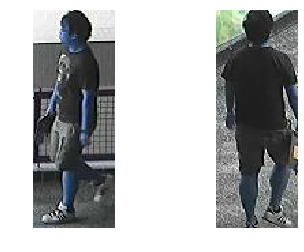

[[2.1142423e-05 9.9997890e-01]]
first pic =  0000_00.jpg
second pic =  0000_04.jpg
answer is =  [0 1]
NN answer is = SAME


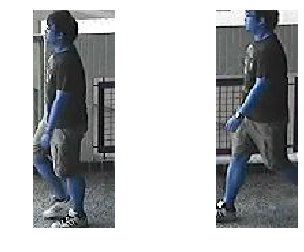

[[2.4375684e-06 9.9999762e-01]]
first pic =  0000_06.jpg
second pic =  0000_09.jpg
answer is =  [0 1]
NN answer is = SAME


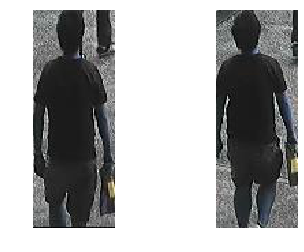

[[7.151061e-05 9.999285e-01]]
first pic =  0000_07.jpg
second pic =  0000_04.jpg
answer is =  [0 1]
NN answer is = SAME


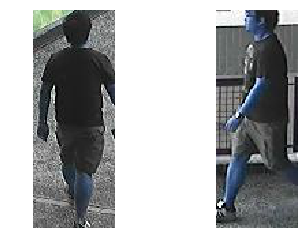

[[4.5637298e-05 9.9995434e-01]]
first pic =  0000_09.jpg
second pic =  0000_08.jpg
answer is =  [0 1]
NN answer is = SAME


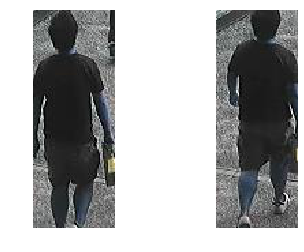

[[1.6984048e-04 9.9983013e-01]]
first pic =  0000_07.jpg
second pic =  0000_03.jpg
answer is =  [0 1]
NN answer is = SAME


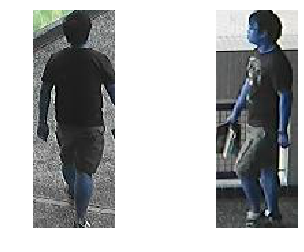

[[7.151061e-05 9.999285e-01]]
first pic =  0000_07.jpg
second pic =  0000_04.jpg
answer is =  [0 1]
NN answer is = SAME


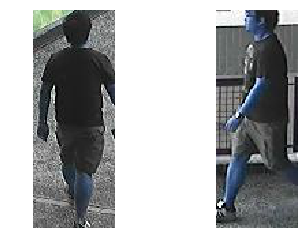

[[0.05826418 0.94173586]]
first pic =  0000_03.jpg
second pic =  0394_07.jpg
answer is =  [1 0]
NN answer is = SAME


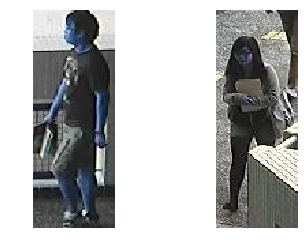

[[9.9981099e-01 1.8899573e-04]]
first pic =  0000_07.jpg
second pic =  0843_03.jpg
answer is =  [1 0]
NN answer is = Different


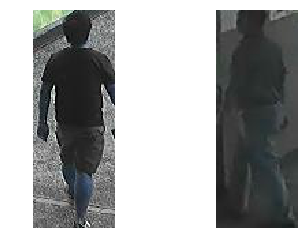

[[0.99398226 0.0060177 ]]
first pic =  0000_08.jpg
second pic =  0787_04.jpg
answer is =  [1 0]
NN answer is = Different


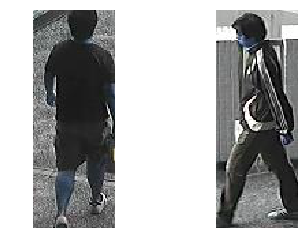

[[0.97132576 0.02867422]]
first pic =  0000_09.jpg
second pic =  0439_02.jpg
answer is =  [1 0]
NN answer is = Different


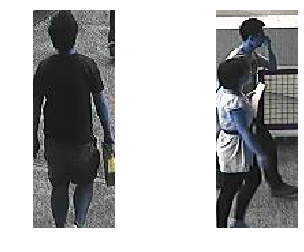

[[9.9993503e-01 6.5011372e-05]]
first pic =  0000_01.jpg
second pic =  1048_08.jpg
answer is =  [1 0]
NN answer is = Different


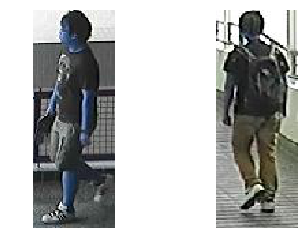

[[9.9966800e-01 3.3198905e-04]]
first pic =  0000_09.jpg
second pic =  1366_06.jpg
answer is =  [1 0]
NN answer is = Different


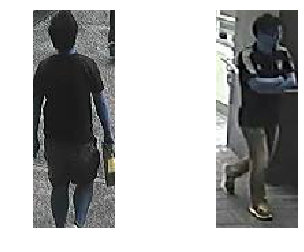

[[0.81171876 0.18828121]]
first pic =  0000_03.jpg
second pic =  0089_03.jpg
answer is =  [1 0]
NN answer is = Different


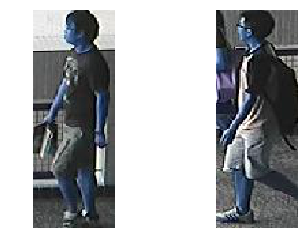

[[9.997620e-01 2.380303e-04]]
first pic =  0000_05.jpg
second pic =  0655_08.jpg
answer is =  [1 0]
NN answer is = Different


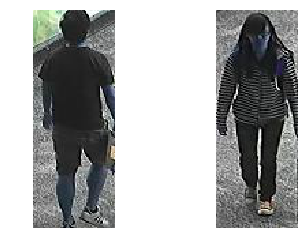

[[9.9999988e-01 7.0854114e-08]]
first pic =  0000_06.jpg
second pic =  1153_04.jpg
answer is =  [1 0]
NN answer is = Different


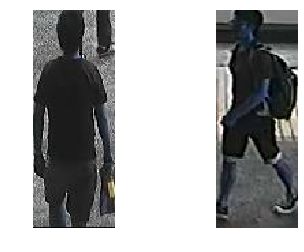

[[0.97081023 0.02918981]]
first pic =  0000_09.jpg
second pic =  0707_08.jpg
answer is =  [1 0]
NN answer is = Different


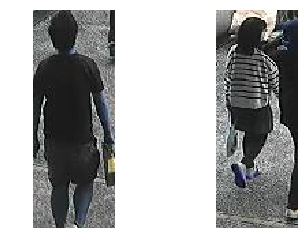

[[4.4974658e-07 9.9999952e-01]]
first pic =  0001_01.jpg
second pic =  0001_04.jpg
answer is =  [0 1]
NN answer is = SAME


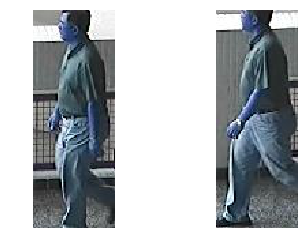

[[8.9851062e-07 9.9999905e-01]]
first pic =  0001_08.jpg
second pic =  0001_07.jpg
answer is =  [0 1]
NN answer is = SAME


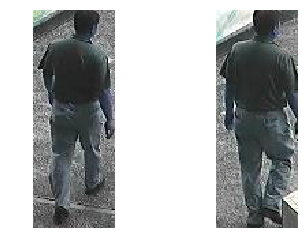

[[5.964274e-04 9.994036e-01]]
first pic =  0001_09.jpg
second pic =  0001_03.jpg
answer is =  [0 1]
NN answer is = SAME


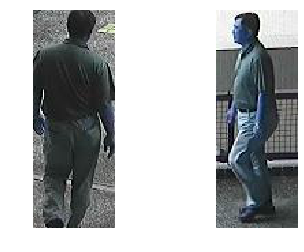

[[9.0259264e-06 9.9999094e-01]]
first pic =  0001_02.jpg
second pic =  0001_08.jpg
answer is =  [0 1]
NN answer is = SAME


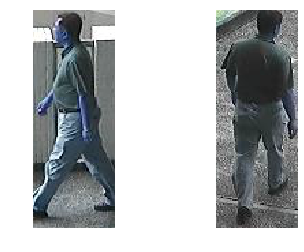

[[1.2982344e-05 9.9998701e-01]]
first pic =  0001_02.jpg
second pic =  0001_07.jpg
answer is =  [0 1]
NN answer is = SAME


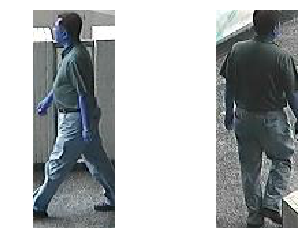

[[9.0259264e-06 9.9999094e-01]]
first pic =  0001_02.jpg
second pic =  0001_08.jpg
answer is =  [0 1]
NN answer is = SAME


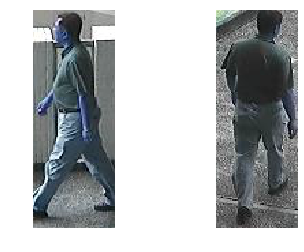

[[0.00237694 0.997623  ]]
first pic =  0001_05.jpg
second pic =  0001_02.jpg
answer is =  [0 1]
NN answer is = SAME


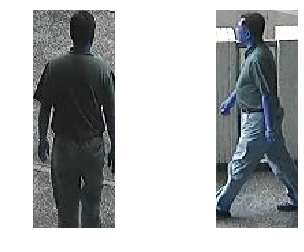

[[1.1299158e-04 9.9988699e-01]]
first pic =  0001_02.jpg
second pic =  0001_05.jpg
answer is =  [0 1]
NN answer is = SAME


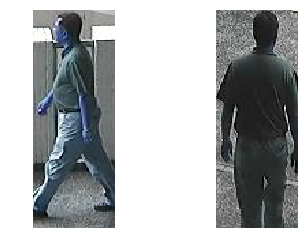

[[9.6729345e-05 9.9990320e-01]]
first pic =  0001_06.jpg
second pic =  0001_03.jpg
answer is =  [0 1]
NN answer is = SAME


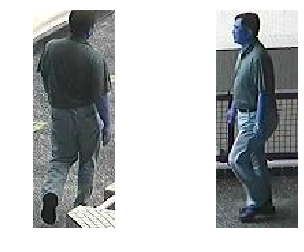

[[0.00212275 0.99787724]]
first pic =  0001_06.jpg
second pic =  0001_00.jpg
answer is =  [0 1]
NN answer is = SAME


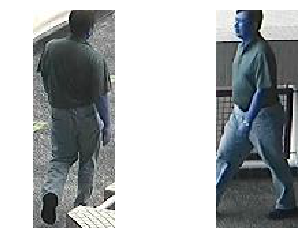

[[9.9965680e-01 3.4321097e-04]]
first pic =  0001_00.jpg
second pic =  1258_05.jpg
answer is =  [1 0]
NN answer is = Different


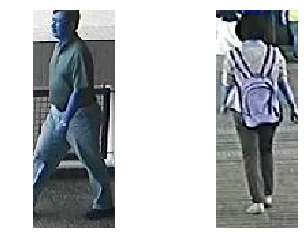

[[9.9995804e-01 4.1966694e-05]]
first pic =  0001_00.jpg
second pic =  1127_09.jpg
answer is =  [1 0]
NN answer is = Different


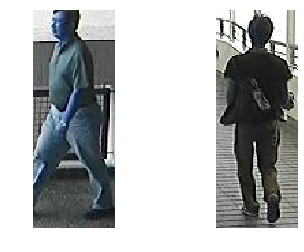

[[9.9999344e-01 6.6074695e-06]]
first pic =  0001_02.jpg
second pic =  0845_05.jpg
answer is =  [1 0]
NN answer is = Different


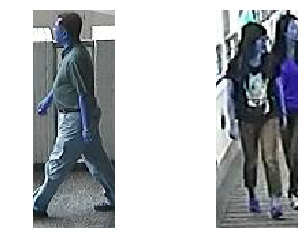

[[9.9999797e-01 1.9980766e-06]]
first pic =  0001_03.jpg
second pic =  0499_09.jpg
answer is =  [1 0]
NN answer is = Different


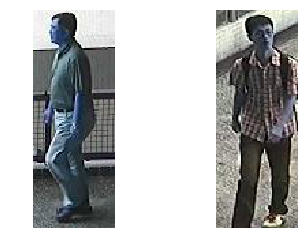

[[0.9858709  0.01412907]]
first pic =  0001_00.jpg
second pic =  0110_04.jpg
answer is =  [1 0]
NN answer is = Different


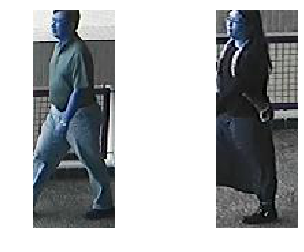

[[1.0000000e+00 1.2268833e-08]]
first pic =  0001_02.jpg
second pic =  1030_07.jpg
answer is =  [1 0]
NN answer is = Different


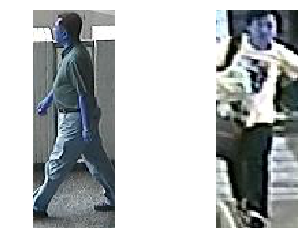

[[9.9999976e-01 1.8442979e-07]]
first pic =  0001_09.jpg
second pic =  1219_04.jpg
answer is =  [1 0]
NN answer is = Different


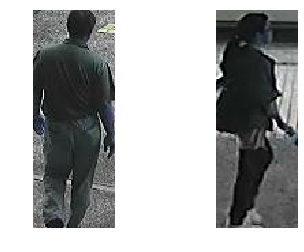

[[0.99814487 0.00185516]]
first pic =  0001_07.jpg
second pic =  1394_08.jpg
answer is =  [1 0]
NN answer is = Different


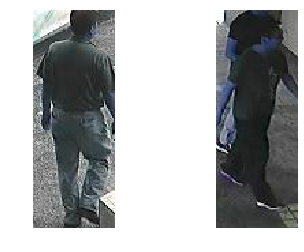

[[9.999994e-01 5.769668e-07]]
first pic =  0001_00.jpg
second pic =  0982_01.jpg
answer is =  [1 0]
NN answer is = Different


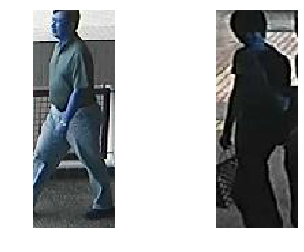

[[9.9999225e-01 7.7892946e-06]]
first pic =  0001_06.jpg
second pic =  1232_09.jpg
answer is =  [1 0]
NN answer is = Different


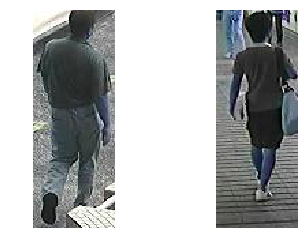

[[1.6861652e-05 9.9998319e-01]]
first pic =  0002_07.jpg
second pic =  0002_03.jpg
answer is =  [0 1]
NN answer is = SAME


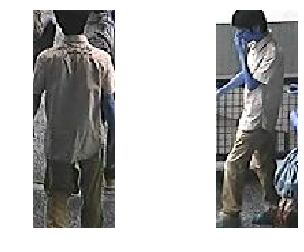

[[7.122756e-04 9.992878e-01]]
first pic =  0002_02.jpg
second pic =  0002_07.jpg
answer is =  [0 1]
NN answer is = SAME


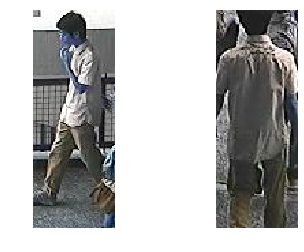

[[4.9136626e-04 9.9950862e-01]]
first pic =  0002_08.jpg
second pic =  0002_00.jpg
answer is =  [0 1]
NN answer is = SAME


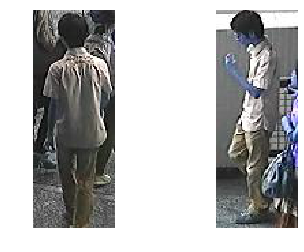

[[7.9444897e-07 9.9999917e-01]]
first pic =  0002_07.jpg
second pic =  0002_05.jpg
answer is =  [0 1]
NN answer is = SAME


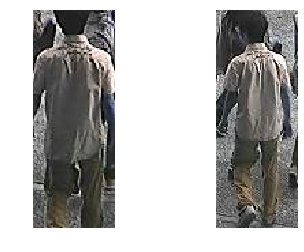

[[7.0209844e-06 9.9999297e-01]]
first pic =  0002_05.jpg
second pic =  0002_03.jpg
answer is =  [0 1]
NN answer is = SAME


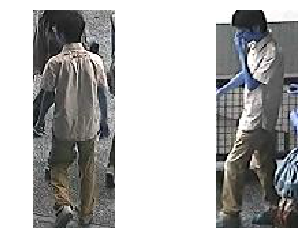

[[9.202102e-06 9.999908e-01]]
first pic =  0002_03.jpg
second pic =  0002_02.jpg
answer is =  [0 1]
NN answer is = SAME


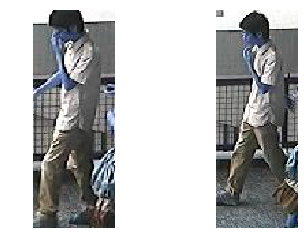

[[2.3881287e-07 9.9999976e-01]]
first pic =  0002_02.jpg
second pic =  0002_03.jpg
answer is =  [0 1]
NN answer is = SAME


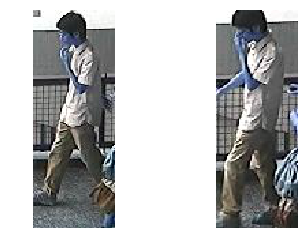

[[0.00208407 0.9979159 ]]
first pic =  0002_03.jpg
second pic =  0002_08.jpg
answer is =  [0 1]
NN answer is = SAME


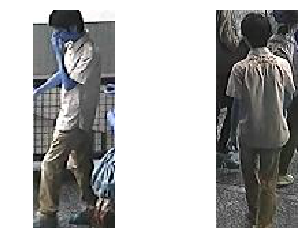

[[1.0653966e-05 9.9998939e-01]]
first pic =  0002_01.jpg
second pic =  0002_08.jpg
answer is =  [0 1]
NN answer is = SAME


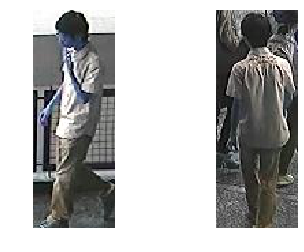

[[7.4049074e-04 9.9925953e-01]]
first pic =  0002_09.jpg
second pic =  0002_07.jpg
answer is =  [0 1]
NN answer is = SAME


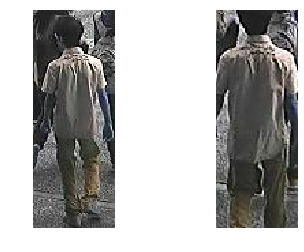

[[9.9951768e-01 4.8227172e-04]]
first pic =  0002_02.jpg
second pic =  0312_07.jpg
answer is =  [1 0]
NN answer is = Different


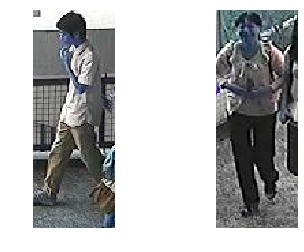

[[9.9980611e-01 1.9397314e-04]]
first pic =  0002_00.jpg
second pic =  0678_06.jpg
answer is =  [1 0]
NN answer is = Different


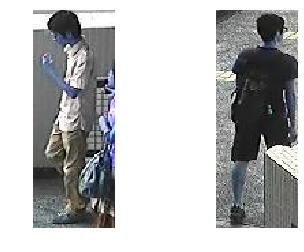

[[9.999901e-01 9.918641e-06]]
first pic =  0002_05.jpg
second pic =  0819_01.jpg
answer is =  [1 0]
NN answer is = Different


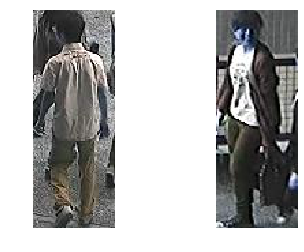

[[0.6677002  0.33229983]]
first pic =  0002_01.jpg
second pic =  1304_01.jpg
answer is =  [1 0]
NN answer is = Different


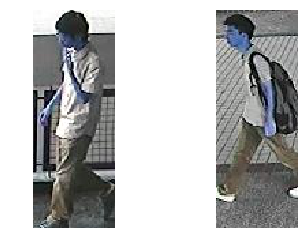

[[1.000000e+00 4.342026e-09]]
first pic =  0002_05.jpg
second pic =  1101_02.jpg
answer is =  [1 0]
NN answer is = Different


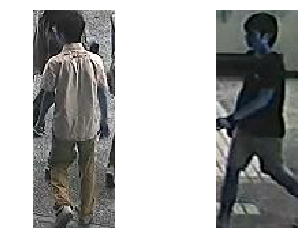

[[9.9997890e-01 2.1132466e-05]]
first pic =  0002_05.jpg
second pic =  0812_07.jpg
answer is =  [1 0]
NN answer is = Different


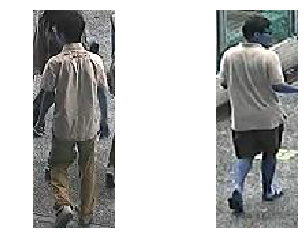

[[9.9997103e-01 2.9006993e-05]]
first pic =  0002_06.jpg
second pic =  0904_09.jpg
answer is =  [1 0]
NN answer is = Different


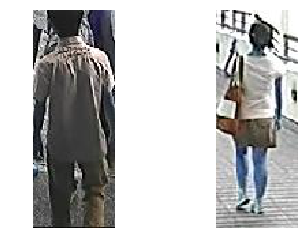

[[9.9998617e-01 1.3834772e-05]]
first pic =  0002_00.jpg
second pic =  0859_09.jpg
answer is =  [1 0]
NN answer is = Different


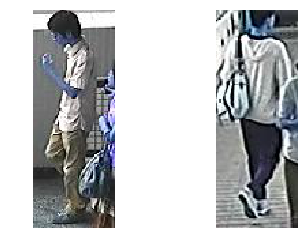

[[9.999901e-01 9.879021e-06]]
first pic =  0002_05.jpg
second pic =  0091_05.jpg
answer is =  [1 0]
NN answer is = Different


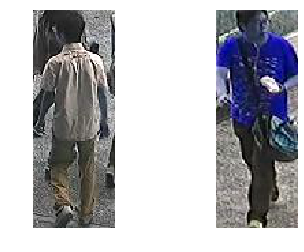

[[0.9554772  0.04452286]]
first pic =  0002_00.jpg
second pic =  0016_01.jpg
answer is =  [1 0]
NN answer is = Different


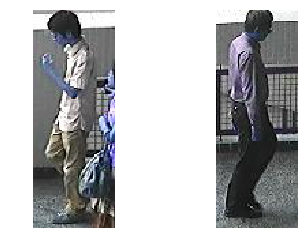

[[4.5728695e-05 9.9995422e-01]]
first pic =  0003_06.jpg
second pic =  0003_02.jpg
answer is =  [0 1]
NN answer is = SAME


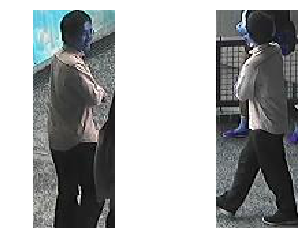

[[1.5288300e-04 9.9984705e-01]]
first pic =  0003_03.jpg
second pic =  0003_07.jpg
answer is =  [0 1]
NN answer is = SAME


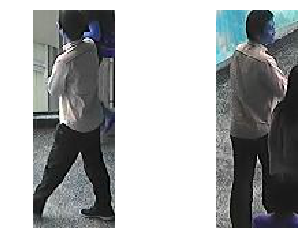

[[4.0566624e-06 9.9999595e-01]]
first pic =  0003_07.jpg
second pic =  0003_02.jpg
answer is =  [0 1]
NN answer is = SAME


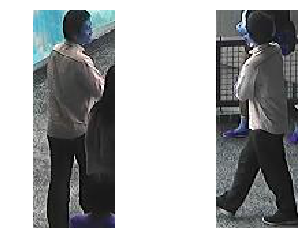

[[6.3244603e-04 9.9936754e-01]]
first pic =  0003_04.jpg
second pic =  0003_07.jpg
answer is =  [0 1]
NN answer is = SAME


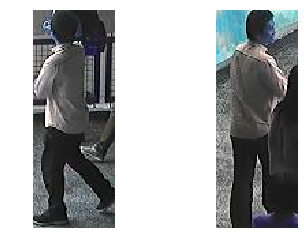

[[0.00480701 0.995193  ]]
first pic =  0003_01.jpg
second pic =  0003_04.jpg
answer is =  [0 1]
NN answer is = SAME


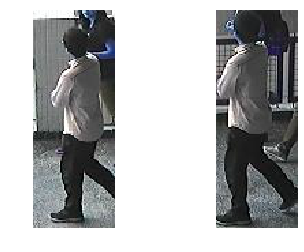

[[0.00221408 0.9977859 ]]
first pic =  0003_02.jpg
second pic =  0003_04.jpg
answer is =  [0 1]
NN answer is = SAME


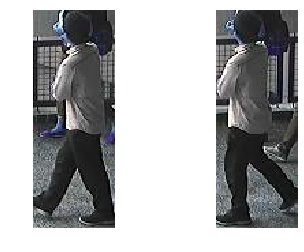

[[0.00135506 0.998645  ]]
first pic =  0003_07.jpg
second pic =  0003_04.jpg
answer is =  [0 1]
NN answer is = SAME


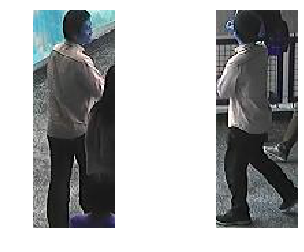

[[1.5288300e-04 9.9984705e-01]]
first pic =  0003_03.jpg
second pic =  0003_07.jpg
answer is =  [0 1]
NN answer is = SAME


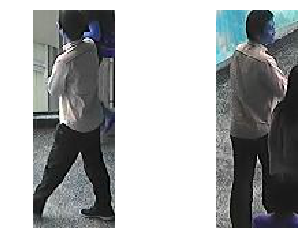

[[4.362555e-06 9.999956e-01]]
first pic =  0003_00.jpg
second pic =  0003_03.jpg
answer is =  [0 1]
NN answer is = SAME


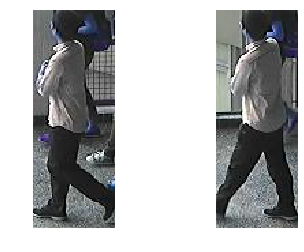

[[9.2717119e-07 9.9999905e-01]]
first pic =  0003_03.jpg
second pic =  0003_06.jpg
answer is =  [0 1]
NN answer is = SAME


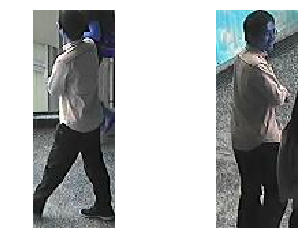

[[0.939552   0.06044795]]
first pic =  0003_03.jpg
second pic =  0631_09.jpg
answer is =  [1 0]
NN answer is = Different


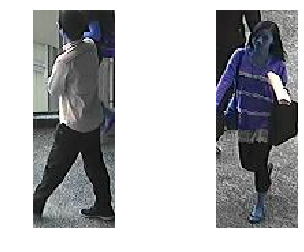

[[0.69920146 0.30079854]]
first pic =  0003_01.jpg
second pic =  0101_06.jpg
answer is =  [1 0]
NN answer is = Different


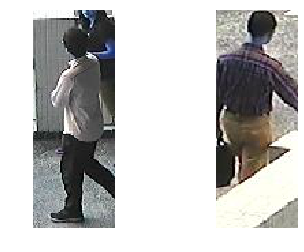

[[0.6304735 0.3695265]]
first pic =  0003_06.jpg
second pic =  0466_06.jpg
answer is =  [1 0]
NN answer is = Different


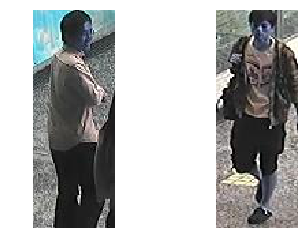

[[9.9982822e-01 1.7177484e-04]]
first pic =  0003_00.jpg
second pic =  0767_05.jpg
answer is =  [1 0]
NN answer is = Different


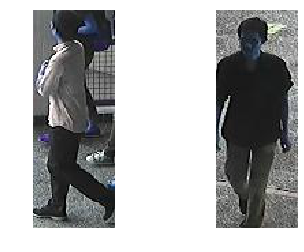

[[0.9883493  0.01165064]]
first pic =  0003_02.jpg
second pic =  0826_00.jpg
answer is =  [1 0]
NN answer is = Different


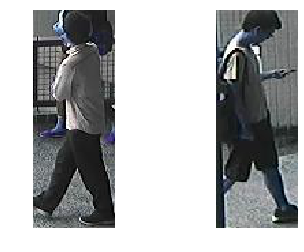

[[9.9999988e-01 1.7701802e-07]]
first pic =  0003_02.jpg
second pic =  1127_00.jpg
answer is =  [1 0]
NN answer is = Different


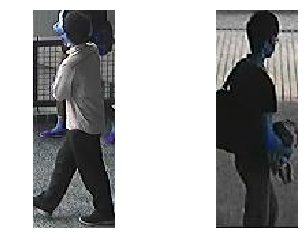

[[9.9992156e-01 7.8392273e-05]]
first pic =  0003_06.jpg
second pic =  0639_09.jpg
answer is =  [1 0]
NN answer is = Different


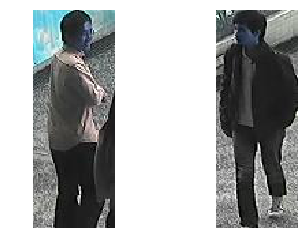

[[0.97095776 0.0290423 ]]
first pic =  0003_05.jpg
second pic =  0558_00.jpg
answer is =  [1 0]
NN answer is = Different


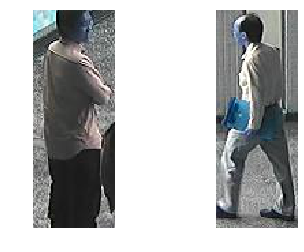

[[9.9994814e-01 5.1825933e-05]]
first pic =  0003_05.jpg
second pic =  1135_01.jpg
answer is =  [1 0]
NN answer is = Different


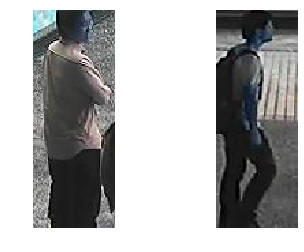

[[9.9996603e-01 3.3963322e-05]]
first pic =  0003_00.jpg
second pic =  1337_04.jpg
answer is =  [1 0]
NN answer is = Different


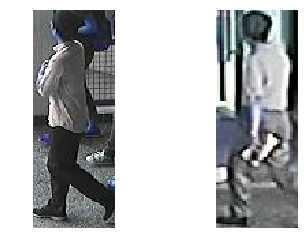

[[6.326595e-04 9.993674e-01]]
first pic =  0004_04.jpg
second pic =  0004_03.jpg
answer is =  [0 1]
NN answer is = SAME


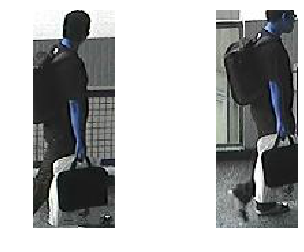

[[0.00146981 0.99853015]]
first pic =  0004_06.jpg
second pic =  0004_04.jpg
answer is =  [0 1]
NN answer is = SAME


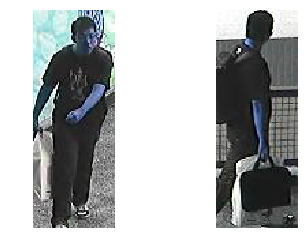

[[0.03556963 0.9644304 ]]
first pic =  0004_03.jpg
second pic =  0004_01.jpg
answer is =  [0 1]
NN answer is = SAME


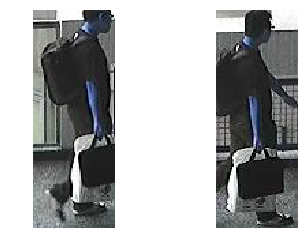

[[1.3753708e-04 9.9986243e-01]]
first pic =  0004_08.jpg
second pic =  0004_06.jpg
answer is =  [0 1]
NN answer is = SAME


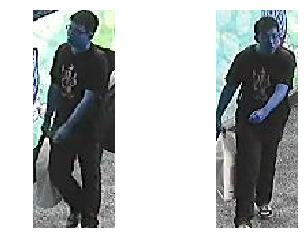

[[0.00388682 0.9961132 ]]
first pic =  0004_08.jpg
second pic =  0004_03.jpg
answer is =  [0 1]
NN answer is = SAME


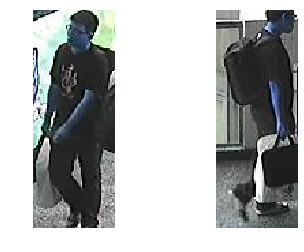

[[0.01155874 0.9884412 ]]
first pic =  0004_00.jpg
second pic =  0004_02.jpg
answer is =  [0 1]
NN answer is = SAME


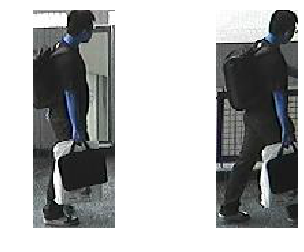

[[0.00125641 0.9987436 ]]
first pic =  0004_06.jpg
second pic =  0004_07.jpg
answer is =  [0 1]
NN answer is = SAME


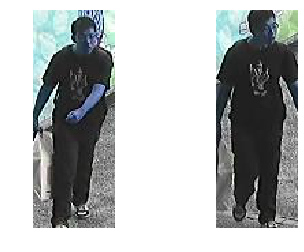

[[1.2185759e-06 9.9999881e-01]]
first pic =  0004_04.jpg
second pic =  0004_00.jpg
answer is =  [0 1]
NN answer is = SAME


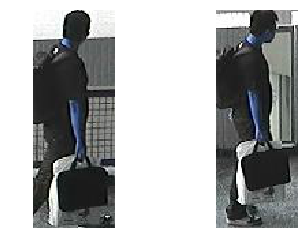

[[0.02470134 0.97529864]]
first pic =  0004_09.jpg
second pic =  0004_04.jpg
answer is =  [0 1]
NN answer is = SAME


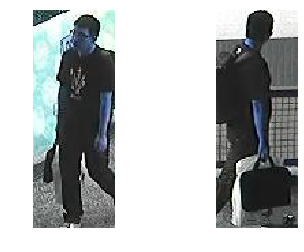

[[2.3192223e-04 9.9976808e-01]]
first pic =  0004_01.jpg
second pic =  0004_08.jpg
answer is =  [0 1]
NN answer is = SAME


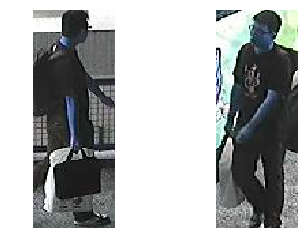

[[9.9908233e-01 9.1766927e-04]]
first pic =  0004_07.jpg
second pic =  1395_07.jpg
answer is =  [1 0]
NN answer is = Different


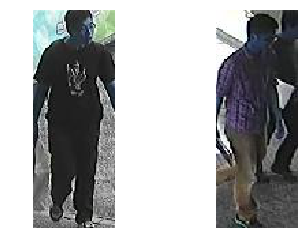

[[0.99862933 0.00137064]]
first pic =  0004_07.jpg
second pic =  0444_05.jpg
answer is =  [1 0]
NN answer is = Different


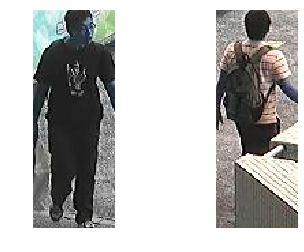

[[9.999920e-01 7.930569e-06]]
first pic =  0004_08.jpg
second pic =  0078_05.jpg
answer is =  [1 0]
NN answer is = Different


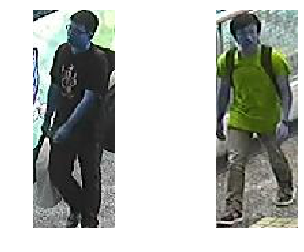

[[9.9979609e-01 2.0395037e-04]]
first pic =  0004_03.jpg
second pic =  0680_00.jpg
answer is =  [1 0]
NN answer is = Different


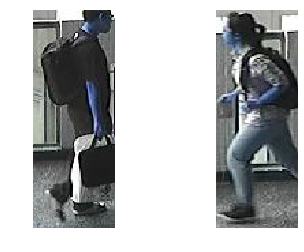

[[9.9999607e-01 3.9357319e-06]]
first pic =  0004_08.jpg
second pic =  1132_08.jpg
answer is =  [1 0]
NN answer is = Different


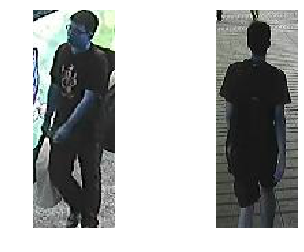

[[9.9973732e-01 2.6266096e-04]]
first pic =  0004_03.jpg
second pic =  0683_03.jpg
answer is =  [1 0]
NN answer is = Different


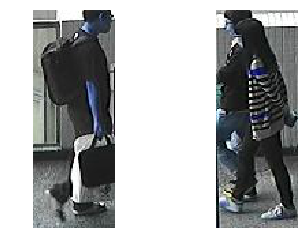

[[9.99986649e-01 1.33987605e-05]]
first pic =  0004_04.jpg
second pic =  1247_08.jpg
answer is =  [1 0]
NN answer is = Different


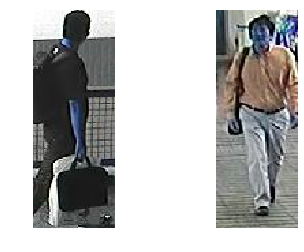

[[0.7290078  0.27099222]]
first pic =  0004_01.jpg
second pic =  0897_00.jpg
answer is =  [1 0]
NN answer is = Different


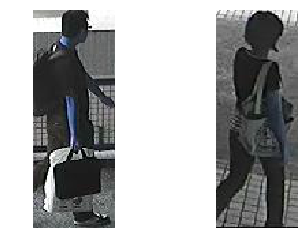

[[9.9962795e-01 3.7203214e-04]]
first pic =  0004_07.jpg
second pic =  1369_03.jpg
answer is =  [1 0]
NN answer is = Different


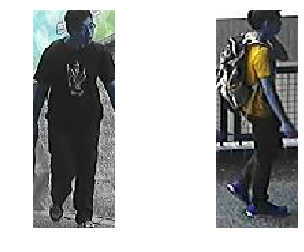

[[9.9999869e-01 1.2977623e-06]]
first pic =  0004_04.jpg
second pic =  0254_06.jpg
answer is =  [1 0]
NN answer is = Different


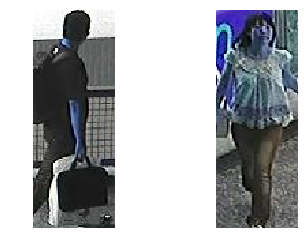

정확도는 =  0.99


In [6]:
#test_size = len(data1)
test_size = 100

data_x_size = 160
data_y_size = 60

test_accuracy = []
for i in range(test_size):
    test_data1 = np.empty((1, data_x_size, data_y_size,3))
    test_data2 = np.empty((1, data_x_size, data_y_size,3))
    test_data1[0,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+file_list[data1[data_index[i]]],cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    test_data2[0,:,:,:] = cv2.resize(cv2.imread(path_dir+'/'+file_list[data2[data_index[i]]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    test_data1 = test_data1.reshape(-1,data_x_size,data_y_size,3)
    test_data2 = test_data2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_data1, X2:test_data2,})
    print(answer)
    
    img1 = cv2.imread(path_dir+'/'+file_list[data1[data_index[i]]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(path_dir+'/'+file_list[data2[data_index[i]]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    
    print("first pic = ",file_list[data1[data_index[i]]])
    print("second pic = ",file_list[data2[data_index[i]]])
    print("answer is = ",CoN[data_index[i]])
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
        test_accuracy.append(CoN[data_index[i]][1])
    else:
        print("NN answer is = Different")
        test_accuracy.append(CoN[data_index[i]][0])
    plt.show()
    plt.close(fig)
print("정확도는 = ",sum(test_accuracy)/len(test_accuracy))

[[0.06664548 0.93335456]]
first pic =  0219001.png
second pic =  0219004.png
answer is =  [0 1]
NN answer is = SAME


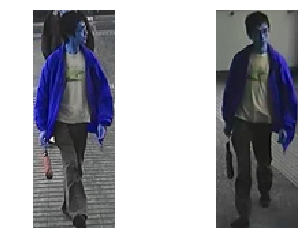

[[0.982336   0.01766397]]
first pic =  0262001.png
second pic =  0474002.png
answer is =  [0 1]
NN answer is = Different


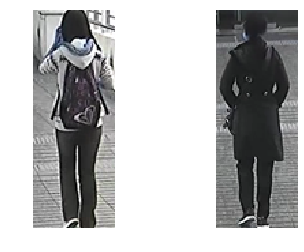

[[0.89185697 0.10814297]]
first pic =  0233002.png
second pic =  0685003.png
answer is =  [0 1]
NN answer is = Different


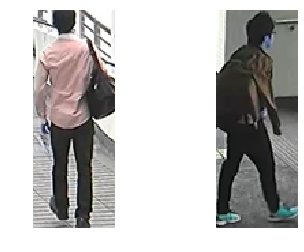

[[9.9999988e-01 1.5473866e-07]]
first pic =  0667001.png
second pic =  0907002.png
answer is =  [0 1]
NN answer is = Different


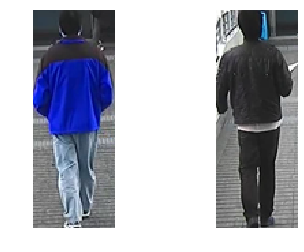

[[4.0952145e-06 9.9999595e-01]]
first pic =  0093001.png
second pic =  0093003.png
answer is =  [0 1]
NN answer is = SAME


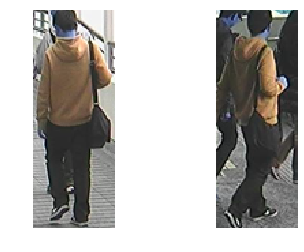

[[9.9987745e-01 1.2254727e-04]]
first pic =  0231003.png
second pic =  0265003.png
answer is =  [0 1]
NN answer is = Different


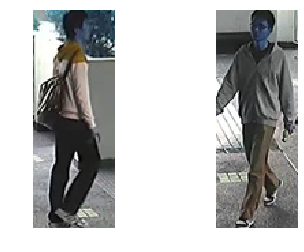

[[0.53589296 0.46410704]]
first pic =  0381004.png
second pic =  0381001.png
answer is =  [0 1]
NN answer is = Different


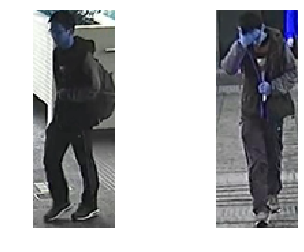

[[9.9992025e-01 7.9731144e-05]]
first pic =  0058001.png
second pic =  0235002.png
answer is =  [0 1]
NN answer is = Different


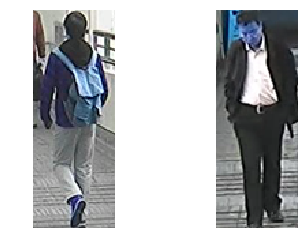

[[0.09631234 0.90368766]]
first pic =  0058003.png
second pic =  0058002.png
answer is =  [0 1]
NN answer is = SAME


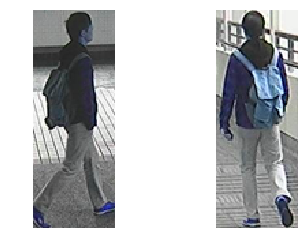

[[0.02519682 0.97480315]]
first pic =  0178003.png
second pic =  0178001.png
answer is =  [0 1]
NN answer is = SAME


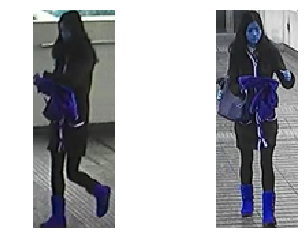

[[0.9979462  0.00205377]]
first pic =  0938003.png
second pic =  0948004.png
answer is =  [1 0]
NN answer is = Different


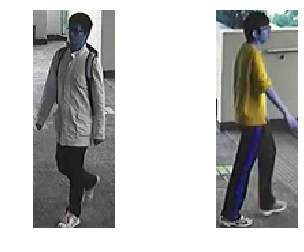

[[0.8632092  0.13679078]]
first pic =  0546004.png
second pic =  0961003.png
answer is =  [1 0]
NN answer is = Different


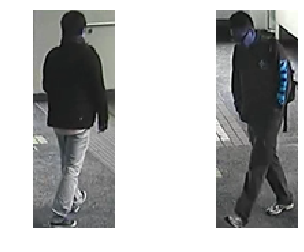

[[0.10521449 0.8947855 ]]
first pic =  0585002.png
second pic =  0585004.png
answer is =  [1 0]
NN answer is = SAME


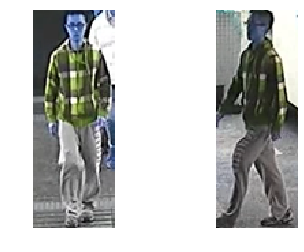

[[4.3845348e-04 9.9956149e-01]]
first pic =  0307004.png
second pic =  0833003.png
answer is =  [1 0]
NN answer is = SAME


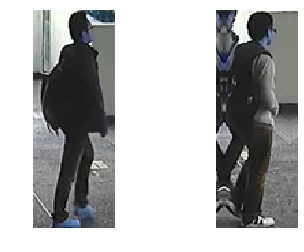

[[0.00302582 0.99697423]]
first pic =  0460002.png
second pic =  0460001.png
answer is =  [1 0]
NN answer is = SAME


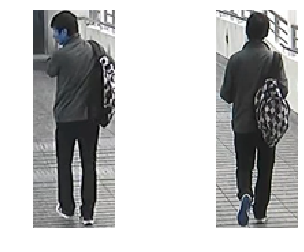

[[0.35039634 0.6496037 ]]
first pic =  0926001.png
second pic =  0927001.png
answer is =  [1 0]
NN answer is = SAME


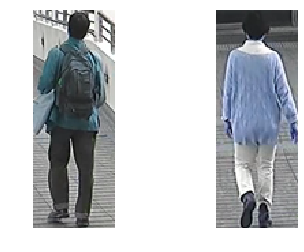

[[0.07093011 0.9290699 ]]
first pic =  0301002.png
second pic =  0301003.png
answer is =  [1 0]
NN answer is = SAME


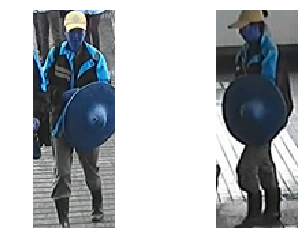

[[9.9999487e-01 5.1367456e-06]]
first pic =  0212004.png
second pic =  0680003.png
answer is =  [1 0]
NN answer is = Different


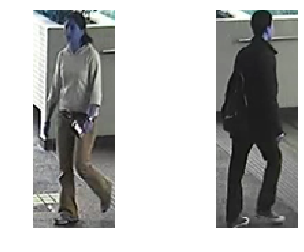

[[0.02871951 0.9712805 ]]
first pic =  0439003.png
second pic =  0657003.png
answer is =  [1 0]
NN answer is = SAME


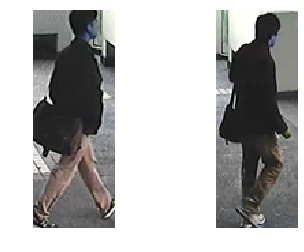

[[0.00229193 0.9977081 ]]
first pic =  0813001.png
second pic =  0813004.png
answer is =  [1 0]
NN answer is = SAME


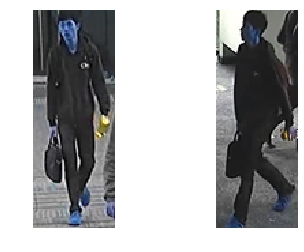

[[6.8671675e-06 9.9999309e-01]]
first pic =  0347003.png
second pic =  0347001.png
answer is =  [0 1]
NN answer is = SAME


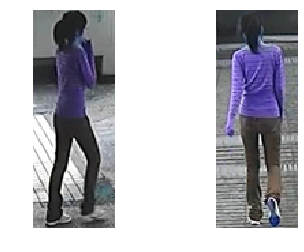

[[0.55208015 0.44791988]]
first pic =  0602003.png
second pic =  0771003.png
answer is =  [0 1]
NN answer is = Different


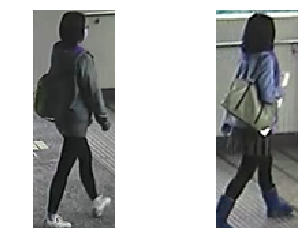

[[2.1284509e-06 9.9999785e-01]]
first pic =  0610002.png
second pic =  0610001.png
answer is =  [0 1]
NN answer is = SAME


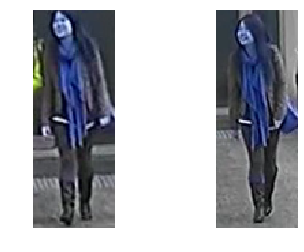

[[6.5645454e-06 9.9999344e-01]]
first pic =  0235001.png
second pic =  0862001.png
answer is =  [0 1]
NN answer is = SAME


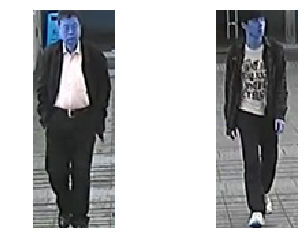

[[9.9969256e-01 3.0741957e-04]]
first pic =  0055003.png
second pic =  0326002.png
answer is =  [0 1]
NN answer is = Different


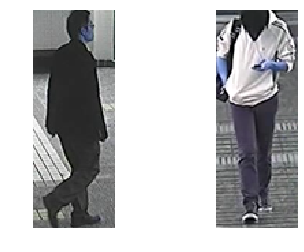

[[9.9944681e-01 5.5318925e-04]]
first pic =  0844001.png
second pic =  0844003.png
answer is =  [0 1]
NN answer is = Different


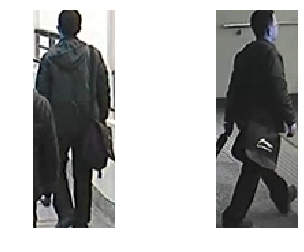

[[0.7324481  0.26755187]]
first pic =  0615001.png
second pic =  0942002.png
answer is =  [0 1]
NN answer is = Different


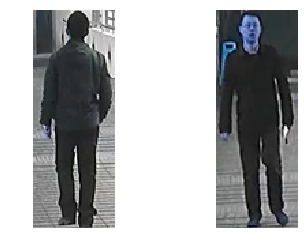

[[9.9999857e-01 1.4080896e-06]]
first pic =  0434001.png
second pic =  0568002.png
answer is =  [0 1]
NN answer is = Different


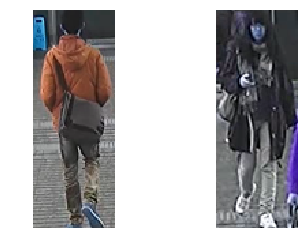

[[9.9999285e-01 7.1834734e-06]]
first pic =  0746002.png
second pic =  0789003.png
answer is =  [0 1]
NN answer is = Different


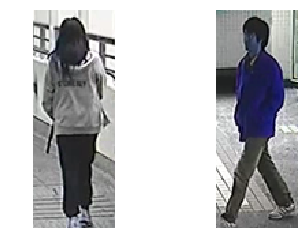

[[5.427478e-07 9.999994e-01]]
first pic =  0845004.png
second pic =  0845003.png
answer is =  [0 1]
NN answer is = SAME


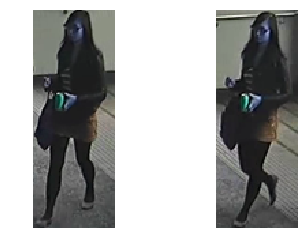

[[2.8492523e-05 9.9997151e-01]]
first pic =  0321004.png
second pic =  0321003.png
answer is =  [1 0]
NN answer is = SAME


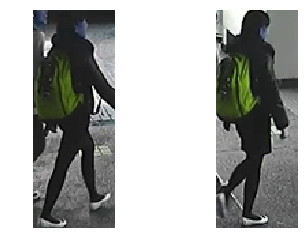

[[0.06779575 0.9322043 ]]
first pic =  0622001.png
second pic =  0714001.png
answer is =  [1 0]
NN answer is = SAME


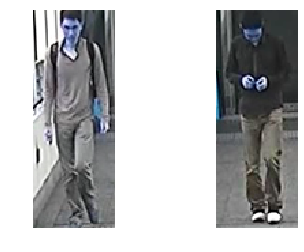

[[0.05529648 0.9447035 ]]
first pic =  0876001.png
second pic =  0904002.png
answer is =  [1 0]
NN answer is = SAME


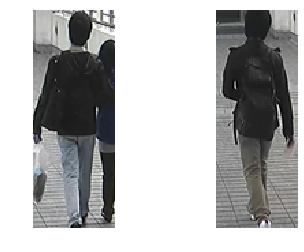

[[0.97928154 0.02071848]]
first pic =  0637004.png
second pic =  0656003.png
answer is =  [1 0]
NN answer is = Different


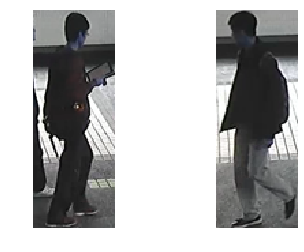

[[3.5762366e-07 9.9999964e-01]]
first pic =  0413001.png
second pic =  0413002.png
answer is =  [1 0]
NN answer is = SAME


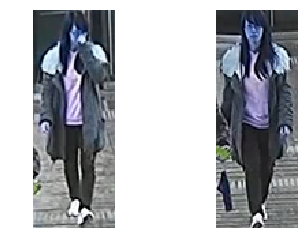

[[9.9985123e-01 1.4871606e-04]]
first pic =  0166002.png
second pic =  0898001.png
answer is =  [1 0]
NN answer is = Different


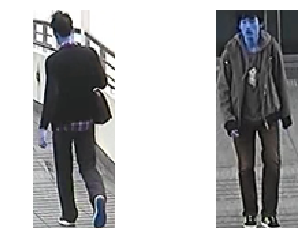

[[0.9982191  0.00178085]]
first pic =  0117002.png
second pic =  0638004.png
answer is =  [1 0]
NN answer is = Different


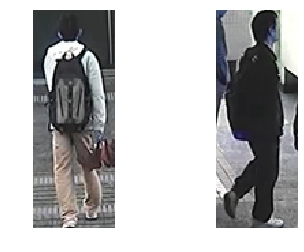

[[1.0632735e-06 9.9999893e-01]]
first pic =  0471001.png
second pic =  0471002.png
answer is =  [1 0]
NN answer is = SAME


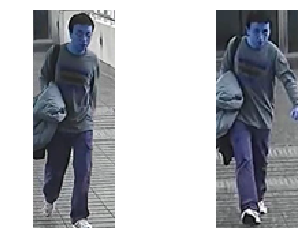

[[0.0394747 0.9605253]]
first pic =  0573002.png
second pic =  0573003.png
answer is =  [1 0]
NN answer is = SAME


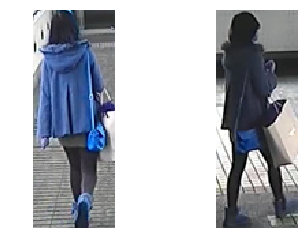

[[7.925155e-05 9.999207e-01]]
first pic =  0313003.png
second pic =  0313004.png
answer is =  [1 0]
NN answer is = SAME


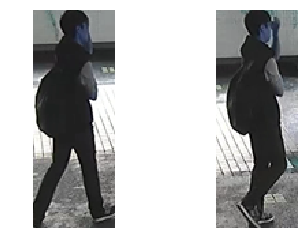

[[0.06598184 0.9340182 ]]
first pic =  0132004.png
second pic =  0132001.png
answer is =  [0 1]
NN answer is = SAME


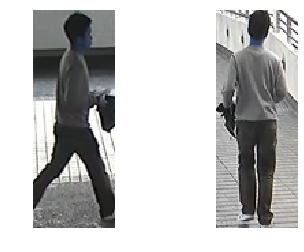

[[5.0827447e-07 9.9999952e-01]]
first pic =  0791002.png
second pic =  0791001.png
answer is =  [0 1]
NN answer is = SAME


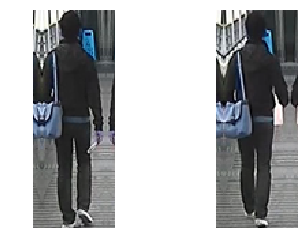

[[1.7406664e-07 9.9999988e-01]]
first pic =  0479003.png
second pic =  0479004.png
answer is =  [0 1]
NN answer is = SAME


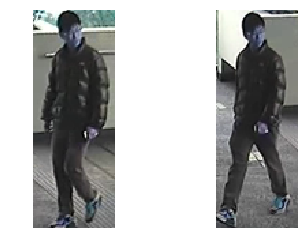

[[9.9958462e-01 4.1540863e-04]]
first pic =  0084001.png
second pic =  0461002.png
answer is =  [0 1]
NN answer is = Different


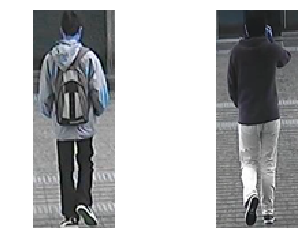

[[0.00126328 0.9987367 ]]
first pic =  0349001.png
second pic =  0349003.png
answer is =  [0 1]
NN answer is = SAME


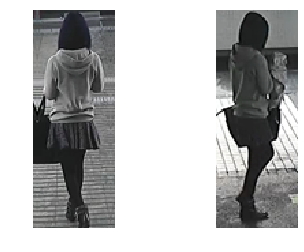

[[2.0479388e-06 9.9999797e-01]]
first pic =  0015002.png
second pic =  0015004.png
answer is =  [0 1]
NN answer is = SAME


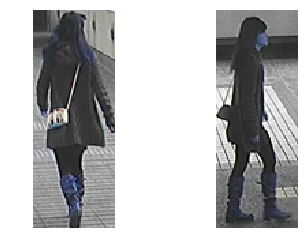

[[0.43353644 0.56646353]]
first pic =  0673001.png
second pic =  0906002.png
answer is =  [0 1]
NN answer is = SAME


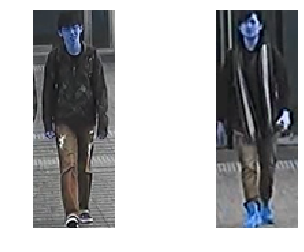

[[0.00309805 0.996902  ]]
first pic =  0958003.png
second pic =  0958001.png
answer is =  [0 1]
NN answer is = SAME


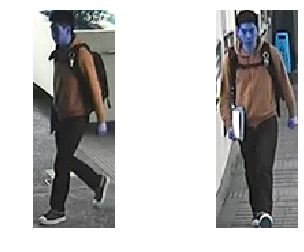

[[9.9999642e-01 3.6037493e-06]]
first pic =  0595001.png
second pic =  0611001.png
answer is =  [0 1]
NN answer is = Different


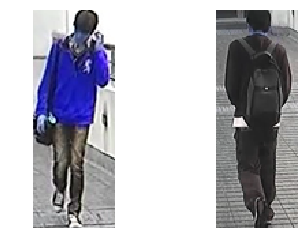

[[0.01959084 0.98040915]]
first pic =  0221003.png
second pic =  0221001.png
answer is =  [0 1]
NN answer is = SAME


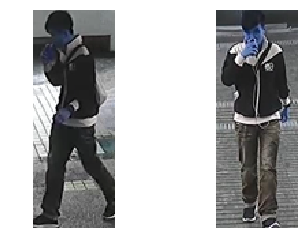

[[0.995261   0.00473898]]
first pic =  0712003.png
second pic =  0940004.png
answer is =  [1 0]
NN answer is = Different


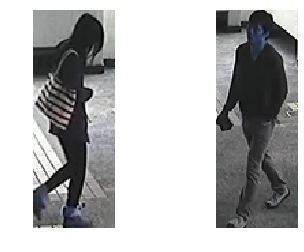

[[0.29047173 0.70952827]]
first pic =  0020004.png
second pic =  0020001.png
answer is =  [1 0]
NN answer is = SAME


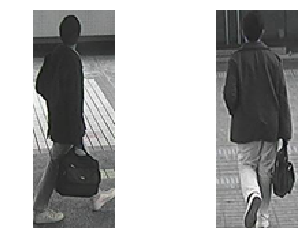

[[6.3997746e-04 9.9936002e-01]]
first pic =  0612003.png
second pic =  0612001.png
answer is =  [1 0]
NN answer is = SAME


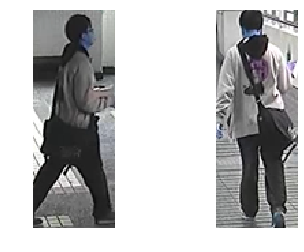

[[0.03407958 0.9659204 ]]
first pic =  0012002.png
second pic =  0265004.png
answer is =  [1 0]
NN answer is = SAME


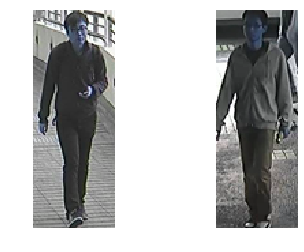

[[0.03144007 0.96855986]]
first pic =  0166001.png
second pic =  0571001.png
answer is =  [1 0]
NN answer is = SAME


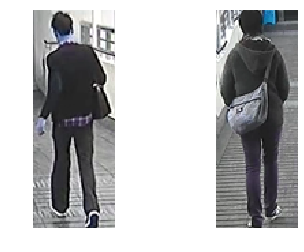

[[9.999970e-01 2.920821e-06]]
first pic =  0030002.png
second pic =  0317002.png
answer is =  [1 0]
NN answer is = Different


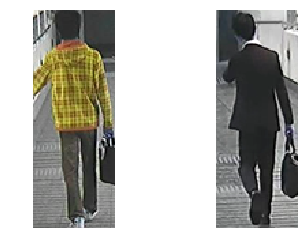

[[0.9585708  0.04142922]]
first pic =  0187004.png
second pic =  0342002.png
answer is =  [1 0]
NN answer is = Different


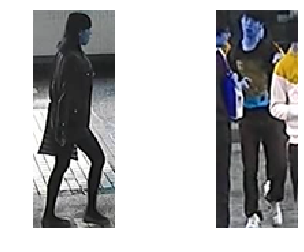

[[2.1815663e-06 9.9999785e-01]]
first pic =  0161001.png
second pic =  0161002.png
answer is =  [1 0]
NN answer is = SAME


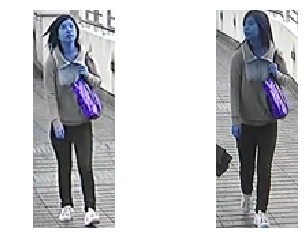

[[4.0590894e-04 9.9959415e-01]]
first pic =  0265001.png
second pic =  0265004.png
answer is =  [1 0]
NN answer is = SAME


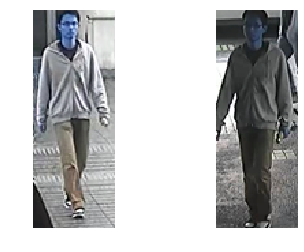

[[9.999994e-01 5.753272e-07]]
first pic =  0395003.png
second pic =  0896001.png
answer is =  [1 0]
NN answer is = Different


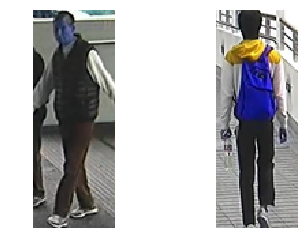

[[9.9988353e-01 1.1651034e-04]]
first pic =  0256001.png
second pic =  0396003.png
answer is =  [0 1]
NN answer is = Different


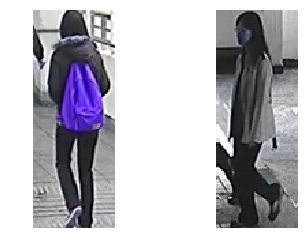

[[9.9991465e-01 8.5402680e-05]]
first pic =  0899003.png
second pic =  0967001.png
answer is =  [0 1]
NN answer is = Different


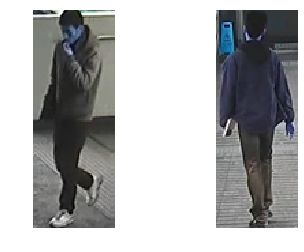

[[0.8989674  0.10103267]]
first pic =  0559004.png
second pic =  0559002.png
answer is =  [0 1]
NN answer is = Different


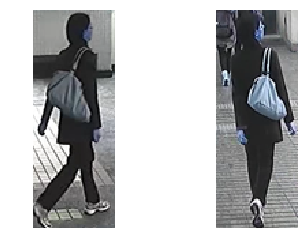

[[2.4679991e-08 1.0000000e+00]]
first pic =  0971001.png
second pic =  0971002.png
answer is =  [0 1]
NN answer is = SAME


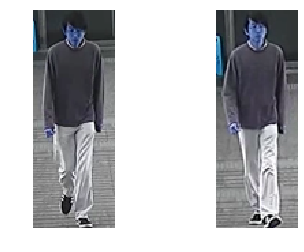

[[0.7654292  0.23457085]]
first pic =  0646003.png
second pic =  0646001.png
answer is =  [0 1]
NN answer is = Different


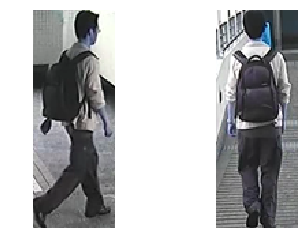

[[0.01066858 0.98933136]]
first pic =  0771002.png
second pic =  0771004.png
answer is =  [0 1]
NN answer is = SAME


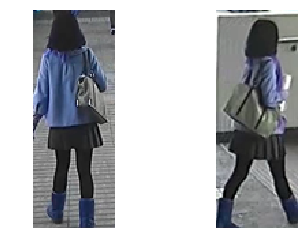

[[0.99574655 0.00425346]]
first pic =  0366002.png
second pic =  0371002.png
answer is =  [0 1]
NN answer is = Different


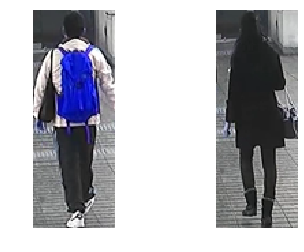

[[0.0014485 0.9985514]]
first pic =  0034001.png
second pic =  0034003.png
answer is =  [0 1]
NN answer is = SAME


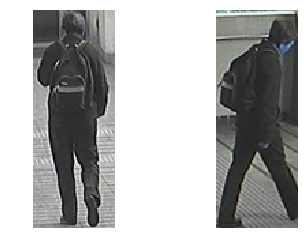

[[0.7168519  0.28314808]]
first pic =  0504004.png
second pic =  0830001.png
answer is =  [0 1]
NN answer is = Different


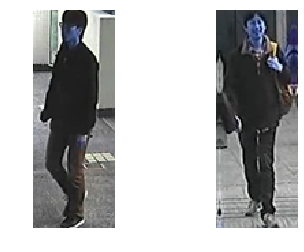

[[0.07230205 0.927698  ]]
first pic =  0487003.png
second pic =  0487002.png
answer is =  [0 1]
NN answer is = SAME


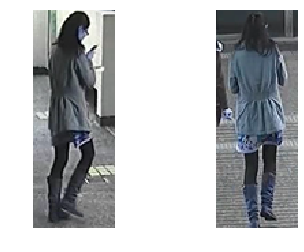

[[0.98193204 0.01806803]]
first pic =  0031004.png
second pic =  0268003.png
answer is =  [1 0]
NN answer is = Different


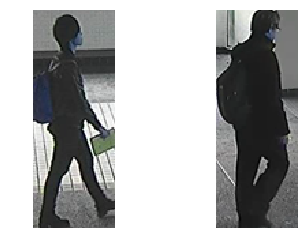

[[1.7757353e-04 9.9982244e-01]]
first pic =  0017004.png
second pic =  0017001.png
answer is =  [1 0]
NN answer is = SAME


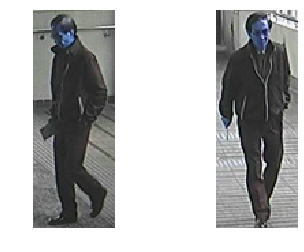

[[1.9838212e-06 9.9999797e-01]]
first pic =  0337002.png
second pic =  0337001.png
answer is =  [1 0]
NN answer is = SAME


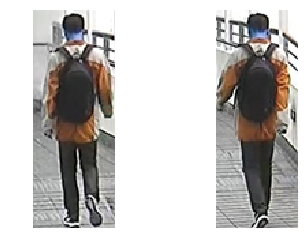

[[9.9991333e-01 8.6671964e-05]]
first pic =  0887003.png
second pic =  0934002.png
answer is =  [1 0]
NN answer is = Different


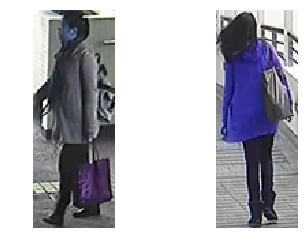

[[5.248747e-07 9.999995e-01]]
first pic =  0455002.png
second pic =  0455001.png
answer is =  [1 0]
NN answer is = SAME


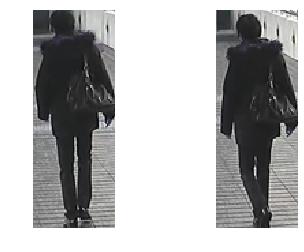

[[6.111450e-07 9.999994e-01]]
first pic =  0645002.png
second pic =  0645001.png
answer is =  [1 0]
NN answer is = SAME


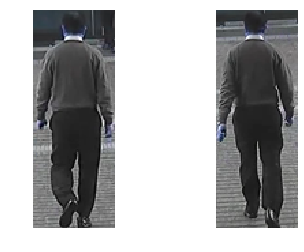

[[0.99771994 0.00227999]]
first pic =  0866003.png
second pic =  0873003.png
answer is =  [1 0]
NN answer is = Different


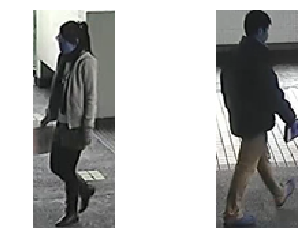

[[9.9954224e-01 4.5781510e-04]]
first pic =  0629004.png
second pic =  0847004.png
answer is =  [1 0]
NN answer is = Different


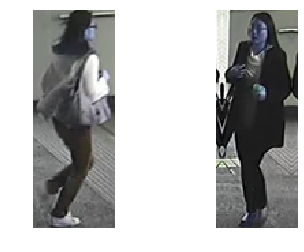

[[0.56907076 0.43092924]]
first pic =  0955002.png
second pic =  0955003.png
answer is =  [1 0]
NN answer is = Different


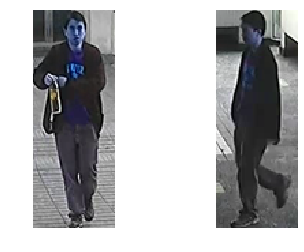

[[0.7095494 0.2904505]]
first pic =  0180001.png
second pic =  0353003.png
answer is =  [1 0]
NN answer is = Different


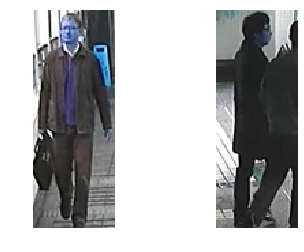

[[0.88877285 0.11122711]]
first pic =  0854002.png
second pic =  0854003.png
answer is =  [0 1]
NN answer is = Different


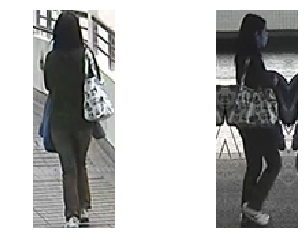

[[0.02981301 0.97018695]]
first pic =  0499001.png
second pic =  0596001.png
answer is =  [0 1]
NN answer is = SAME


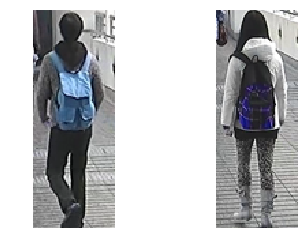

[[0.5678545 0.4321455]]
first pic =  0913004.png
second pic =  0913001.png
answer is =  [0 1]
NN answer is = Different


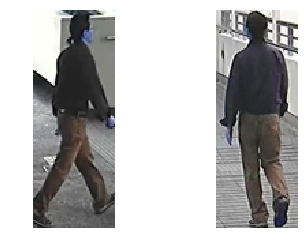

[[9.9946624e-01 5.3371419e-04]]
first pic =  0888001.png
second pic =  0918002.png
answer is =  [0 1]
NN answer is = Different


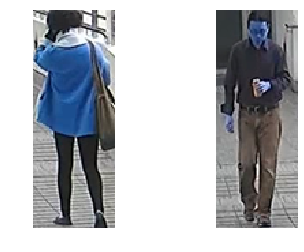

[[0.00185173 0.9981483 ]]
first pic =  0525004.png
second pic =  0525002.png
answer is =  [0 1]
NN answer is = SAME


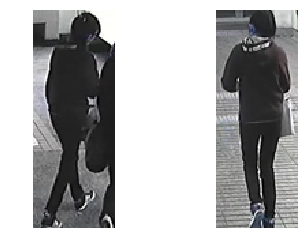

[[0.01823065 0.9817693 ]]
first pic =  0560001.png
second pic =  0835001.png
answer is =  [0 1]
NN answer is = SAME


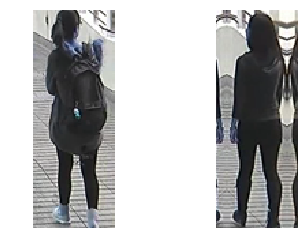

[[0.00511786 0.9948821 ]]
first pic =  0833004.png
second pic =  0874001.png
answer is =  [0 1]
NN answer is = SAME


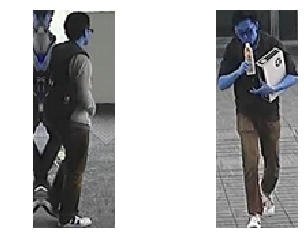

[[0.9914268  0.00857319]]
first pic =  0037001.png
second pic =  0091003.png
answer is =  [0 1]
NN answer is = Different


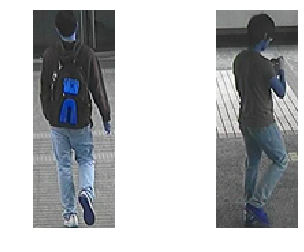

[[4.291632e-04 9.995708e-01]]
first pic =  0932003.png
second pic =  0943004.png
answer is =  [0 1]
NN answer is = SAME


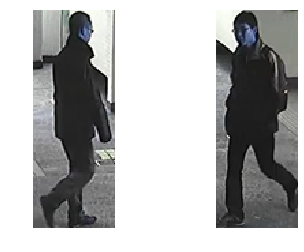

[[8.9111217e-07 9.9999917e-01]]
first pic =  0658002.png
second pic =  0658001.png
answer is =  [0 1]
NN answer is = SAME


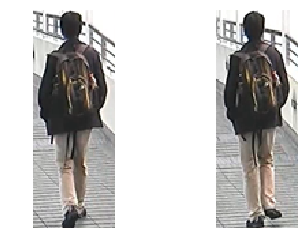

[[0.19555499 0.804445  ]]
first pic =  0454003.png
second pic =  0941001.png
answer is =  [1 0]
NN answer is = SAME


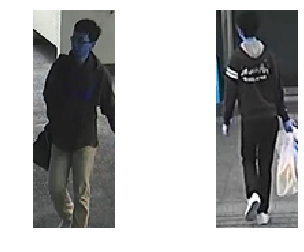

[[0.00621161 0.9937884 ]]
first pic =  0577001.png
second pic =  0577004.png
answer is =  [1 0]
NN answer is = SAME


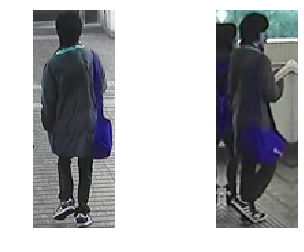

[[0.00107412 0.99892586]]
first pic =  0172001.png
second pic =  0172003.png
answer is =  [1 0]
NN answer is = SAME


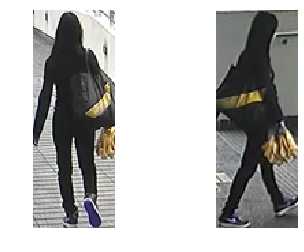

[[1.332673e-04 9.998667e-01]]
first pic =  0812004.png
second pic =  0812001.png
answer is =  [1 0]
NN answer is = SAME


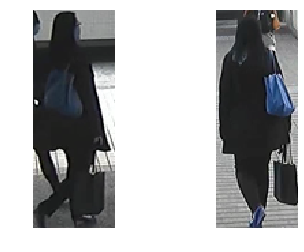

[[0.996924   0.00307597]]
first pic =  0682002.png
second pic =  0820004.png
answer is =  [1 0]
NN answer is = Different


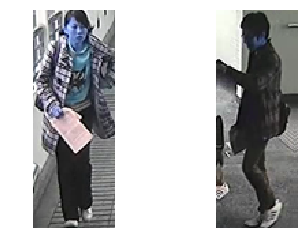

[[9.999771e-01 2.287341e-05]]
first pic =  0666002.png
second pic =  0951003.png
answer is =  [1 0]
NN answer is = Different


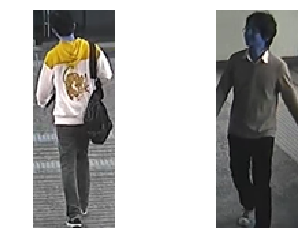

[[0.02031106 0.97968894]]
first pic =  0957001.png
second pic =  0957003.png
answer is =  [1 0]
NN answer is = SAME


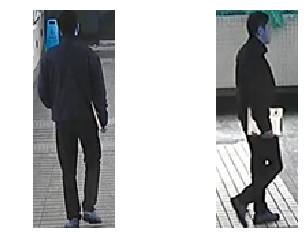

[[5.539406e-04 9.994461e-01]]
first pic =  0303004.png
second pic =  0520002.png
answer is =  [1 0]
NN answer is = SAME


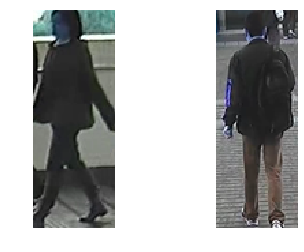

[[3.0673167e-05 9.9996936e-01]]
first pic =  0652002.png
second pic =  0776002.png
answer is =  [1 0]
NN answer is = SAME


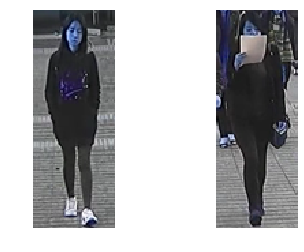

[[9.9967062e-01 3.2942518e-04]]
first pic =  0525004.png
second pic =  0689003.png
answer is =  [1 0]
NN answer is = Different


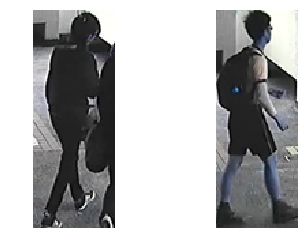

정확도는 =  0.77


In [9]:
#test_size = len(data1)
test_size = 100

data_x_size = 160
data_y_size = 60

test_accuracy = []
for i in range(test_size):
    test_img1 = np.empty((1, data_x_size, data_y_size,3))
    test_img2 = np.empty((1, data_x_size, data_y_size,3))
    test_img1[0,:,:,:] = cv2.resize(cv2.imread(test_path_dir+'/'+p_list[test_data1[test_data_index[i]]],cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    test_img2[0,:,:,:] = cv2.resize(cv2.imread(test_path_dir+'/'+p_list[test_data2[test_data_index[i]]],cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
    test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_img1, X2:test_img2,})
    print(answer)
    
    img1 = cv2.imread(test_path_dir+'/'+p_list[test_data1[test_data_index[i]]],cv2.IMREAD_COLOR)
    img2 = cv2.imread(test_path_dir+'/'+p_list[test_data2[test_data_index[i]]],cv2.IMREAD_COLOR)
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    
    print("first pic = ",p_list[test_data1[test_data_index[i]]])
    print("second pic = ",p_list[test_data2[test_data_index[i]]])
    print("answer is = ",CoN[data_index[i]])
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
        test_accuracy.append(test_CoN[test_data_index[i]][1])
    else:
        print("NN answer is = Different")
        test_accuracy.append(test_CoN[test_data_index[i]][0])
    plt.show()
    plt.close(fig)
print("정확도는 = ",sum(test_accuracy)/len(test_accuracy))

[0.9997602, 0.9997323, 0.9971222, 0.9911184, 0.984278, 0.97712654, 0.9237566, 0.6963439]


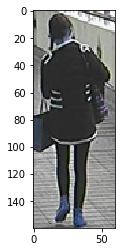

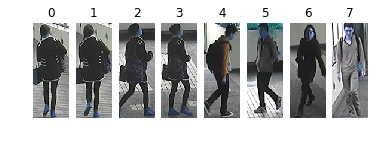

[0.9998729, 0.9997391, 0.994624, 0.9917464, 0.97532916, 0.89420325, 0.42698878, 0.25549346]


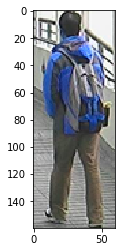

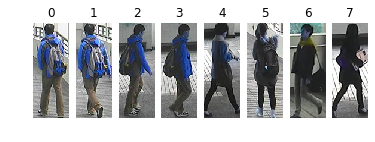

[0.9998109, 0.9991998, 0.9981071, 0.998007, 0.99662775, 0.9963754, 0.9717596, 0.9697684]


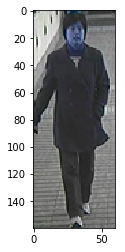

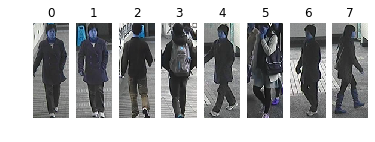

[0.999818, 0.99853516, 0.9982029, 0.99718744, 0.991927, 0.81444114, 0.78963876, 0.25330433]


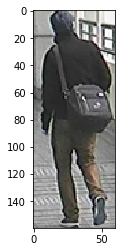

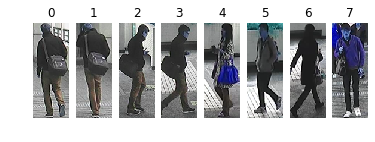

[0.99986243, 0.9991412, 0.9932817, 0.96931297, 0.30591357, 0.092837766, 0.08496974, 0.0044887722]


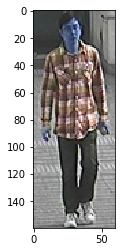

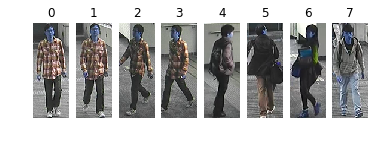

[0.9998921, 0.99979204, 0.9996269, 0.99316025, 0.9329939, 0.817657, 0.5590533, 0.21092783]


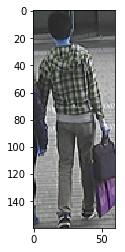

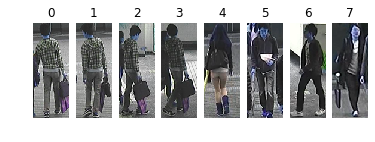

[0.9998759, 0.9993793, 0.9971083, 0.99683017, 0.7658689, 0.31760025, 0.21178153, 0.07778224]


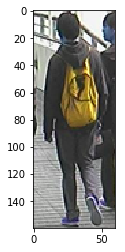

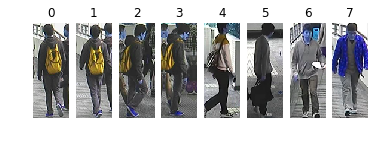

[0.99989533, 0.9993957, 0.9981231, 0.9953375, 0.93466073, 0.9096304, 0.83369017, 0.33749533]


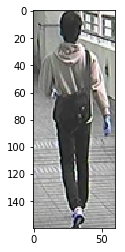

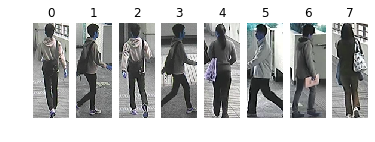

[0.99987006, 0.9980527, 0.9878687, 0.982743, 0.8870693, 0.6609319, 0.38119972, 0.113083035]


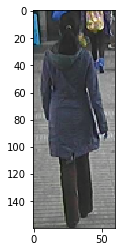

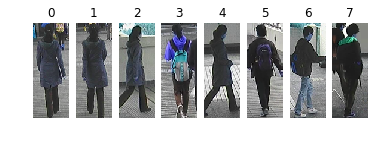

[0.99980813, 0.999131, 0.99392927, 0.9933961, 0.8116173, 0.6576846, 0.11101839, 0.030674575]


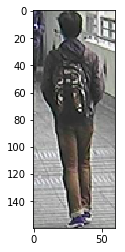

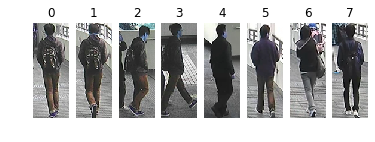

[0.9997092, 0.99878305, 0.99863607, 0.99522674, 0.9950771, 0.9931352, 0.9314225, 0.7232977]


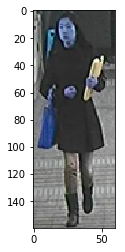

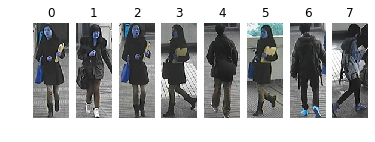

[0.99987817, 0.9995653, 0.9994634, 0.9990363, 0.99256986, 0.99192953, 0.89689356, 0.6545955]


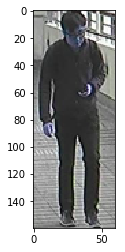

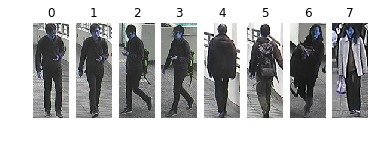

[0.9997427, 0.9979448, 0.9676889, 0.9661985, 0.30447748, 0.113113455, 0.081422865, 0.009273712]


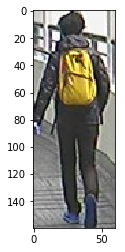

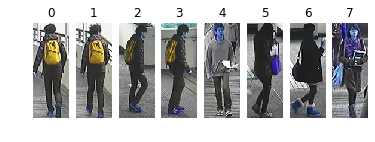

[0.99968207, 0.9983193, 0.99679464, 0.9913675, 0.9528178, 0.8722662, 0.29377243, 0.08837133]


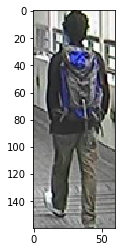

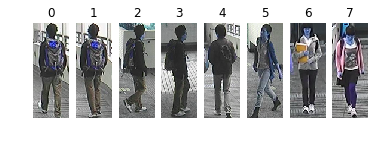

[0.9998418, 0.9998348, 0.9988193, 0.99706334, 0.9446672, 0.92111236, 0.5445933, 0.057995323]


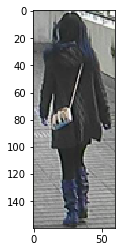

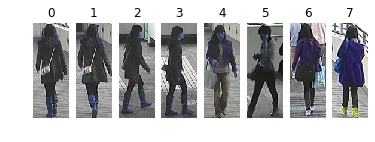

[0.9998394, 0.9996599, 0.99679947, 0.99415034, 0.98024195, 0.9742459, 0.44817016, 0.33659372]


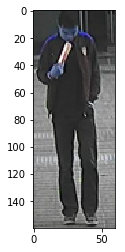

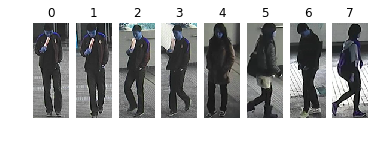

[0.99987495, 0.9993861, 0.9977804, 0.99760544, 0.9224224, 0.88905215, 0.82028687, 0.13909861]


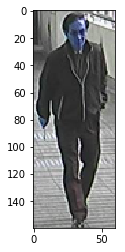

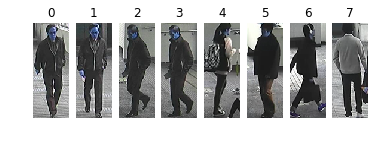

[0.9997222, 0.99926955, 0.9952916, 0.9823116, 0.92383546, 0.6376208, 0.6071378, 0.008785448]


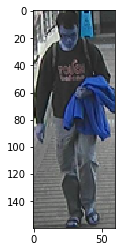

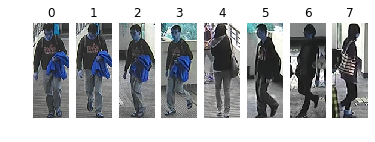

[0.9999263, 0.9994325, 0.9935042, 0.98465365, 0.75905335, 0.3097559, 0.2543054, 0.23980305]


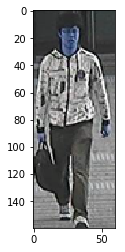

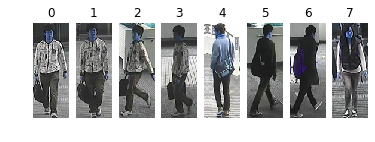

[0.99991286, 0.9999064, 0.9972543, 0.99168277, 0.88711697, 0.8851117, 0.8025462, 0.63402206]


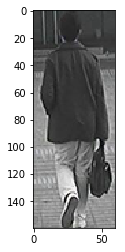

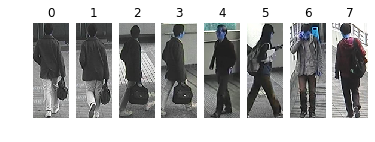

[0.9998344, 0.99977297, 0.9943468, 0.99042094, 0.9726917, 0.96868145, 0.96821165, 0.02214632]


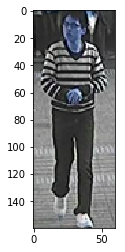

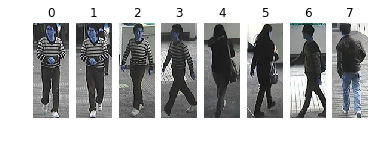

[0.9999157, 0.99839634, 0.9814594, 0.9201682, 0.61391884, 0.2564365, 0.037559308, 0.016584622]


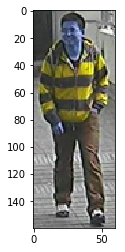

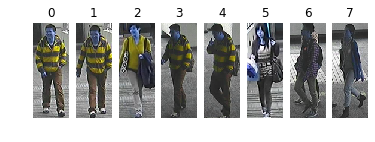

[0.9997328, 0.9995528, 0.99792755, 0.99728, 0.99562573, 0.99437946, 0.99125963, 0.9745453]


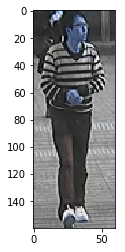

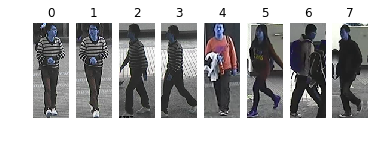

[0.9999393, 0.99946684, 0.97938055, 0.97770625, 0.9723953, 0.8117704, 0.11040114, 0.085704796]


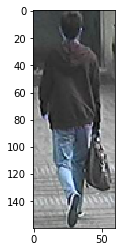

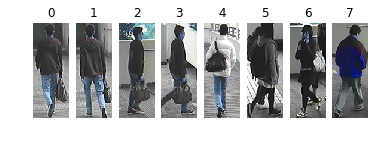

[0.9998592, 0.99961287, 0.9993481, 0.9992206, 0.99874216, 0.94806457, 0.5753893, 0.5424295]


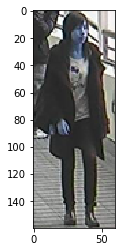

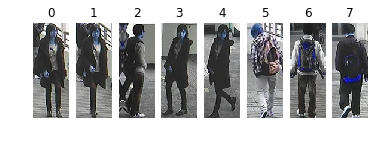

[0.999616, 0.9992248, 0.9951186, 0.9878732, 0.9504361, 0.8661052, 0.60914165, 0.5225309]


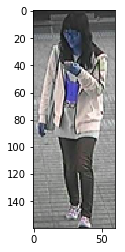

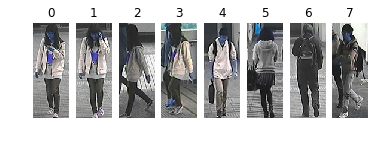

[0.99988294, 0.9998536, 0.99766445, 0.99518317, 0.75775254, 0.5636383, 0.54275835, 0.35636944]


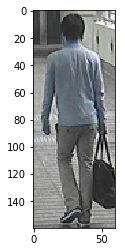

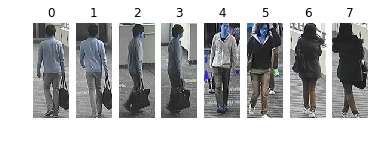

[0.99982363, 0.9998103, 0.99954873, 0.9995338, 0.9425503, 0.8960379, 0.894584, 0.318784]


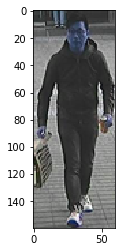

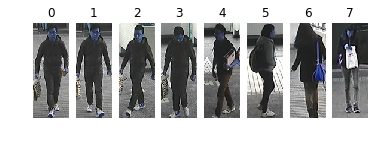

[0.9997733, 0.99918455, 0.98652434, 0.9839521, 0.9808332, 0.97447973, 0.9214253, 0.3443255]


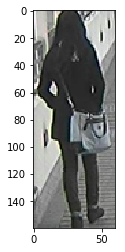

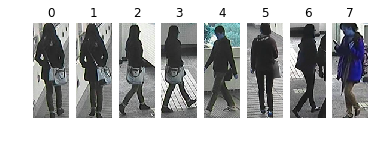

[0.9999026, 0.99989355, 0.9591542, 0.79992884, 0.7237863, 0.3247021, 0.062746495, 0.017459858]


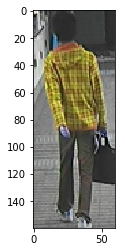

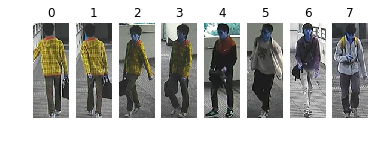

[0.9997019, 0.99726045, 0.9733052, 0.95914286, 0.95574355, 0.8125065, 0.69167453, 0.25377744]


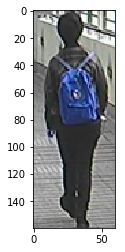

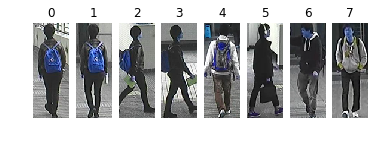

[0.99981993, 0.9995926, 0.9992181, 0.9986474, 0.99739575, 0.9819078, 0.9796704, 0.87892574]


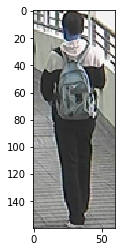

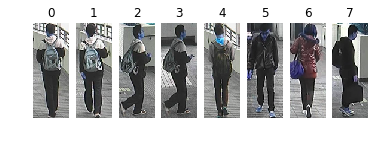

[0.9998976, 0.99953604, 0.7327517, 0.41899195, 0.2968652, 0.20577012, 0.10198953, 0.05833751]


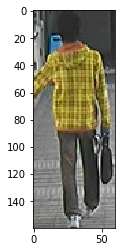

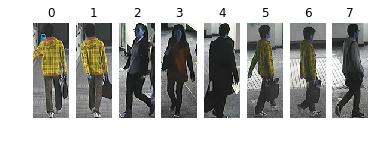

[0.9999356, 0.9998766, 0.9958264, 0.9924865, 0.98190284, 0.96238935, 0.36301917, 0.14515805]


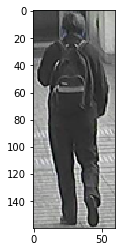

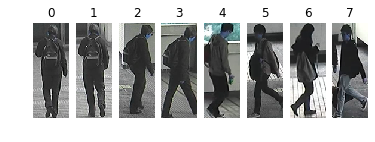

[0.9997615, 0.9985985, 0.99456125, 0.99105084, 0.98324513, 0.9429567, 0.68603826, 0.046069525]


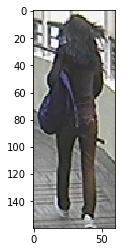

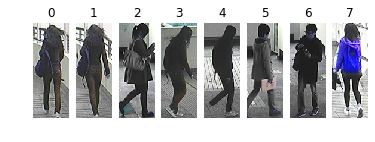

[0.9998229, 0.9997533, 0.9988324, 0.99815696, 0.9674396, 0.7009181, 0.4835538, 0.14637011]


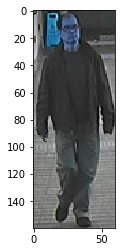

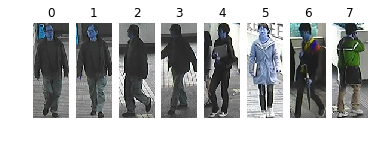

[0.99977964, 0.998804, 0.9771922, 0.9200887, 0.14600632, 0.085320815, 0.072460756, 0.067529604]


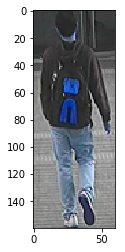

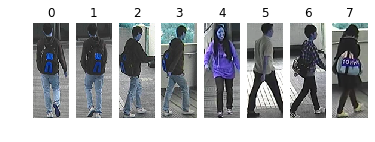

[0.99987924, 0.9998596, 0.9993087, 0.98936826, 0.9853807, 0.95582134, 0.86111504, 0.5091178]


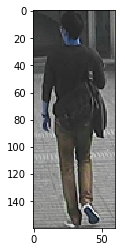

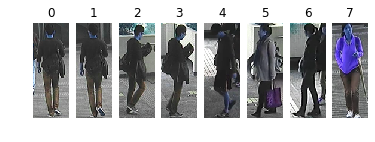

[0.99990237, 0.99957734, 0.99933535, 0.9979925, 0.89092475, 0.6023406, 0.58743984, 0.016371835]


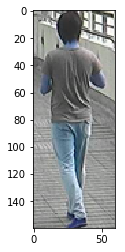

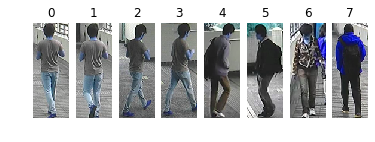

[0.99979323, 0.999532, 0.99682415, 0.9937018, 0.9873383, 0.94574404, 0.9344462, 0.35820538]


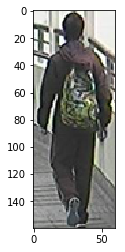

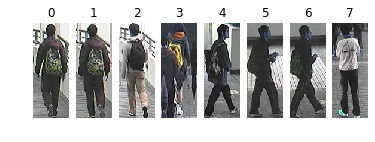

[0.9998155, 0.99944323, 0.9963825, 0.98244065, 0.96330917, 0.89496726, 0.5893005, 0.25842357]


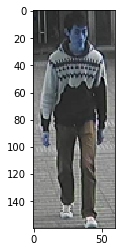

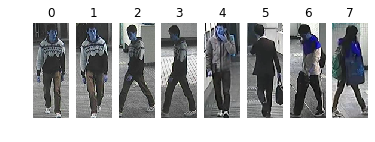

[0.99989617, 0.9998441, 0.9997187, 0.9993272, 0.99872273, 0.76600033, 0.72064924, 0.3450146]


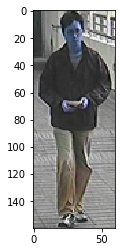

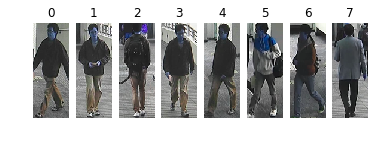

[0.9998375, 0.99943, 0.99684477, 0.9942008, 0.9871356, 0.9138583, 0.8453554, 0.06818894]


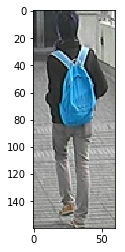

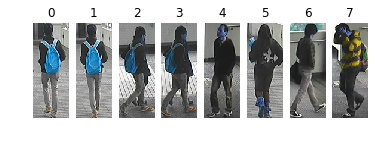

[0.9998828, 0.9996823, 0.99926037, 0.9987507, 0.98509765, 0.9497535, 0.90210164, 0.35657656]


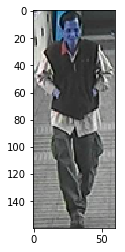

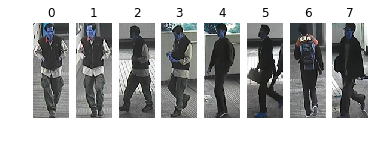

[0.9998584, 0.9996902, 0.9986405, 0.9985191, 0.9621591, 0.6497937, 0.37070096, 0.28851265]


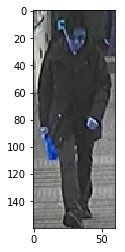

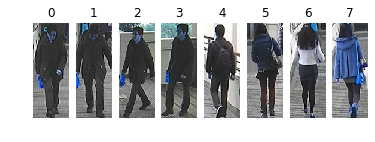

[0.9998802, 0.99968386, 0.9995658, 0.9995316, 0.94499, 0.825203, 0.7112906, 0.11093289]


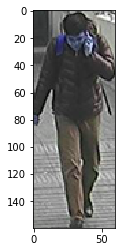

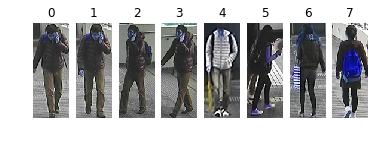

[0.99971205, 0.99939907, 0.9466056, 0.7336385, 0.732503, 0.21289887, 0.04501011, 0.015969474]


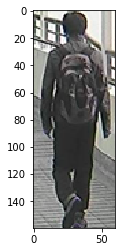

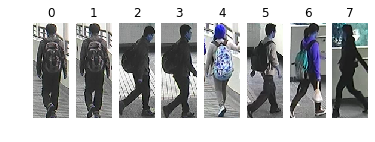

[0.9998425, 0.99962556, 0.9861583, 0.9829616, 0.95072514, 0.47629687, 0.3325351, 0.32635]


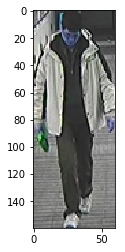

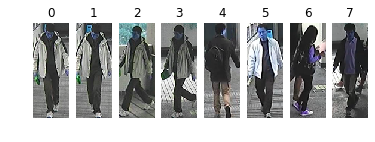

[0.9998368, 0.99967563, 0.9994124, 0.9942762, 0.5205457, 0.41704026, 0.27650186, 0.041037828]


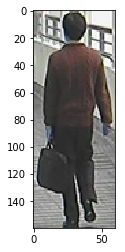

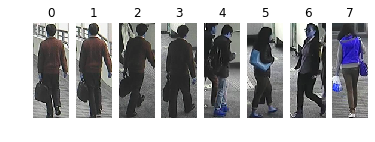

[0.9998387, 0.9989742, 0.9985241, 0.99760216, 0.98540145, 0.92486095, 0.33046514, 0.13009425]


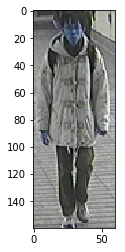

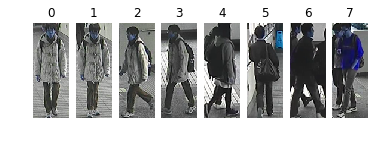

[0.9998647, 0.99969184, 0.9989365, 0.9976693, 0.980628, 0.96595997, 0.9365843, 0.8179454]


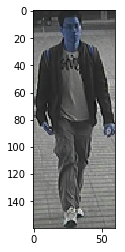

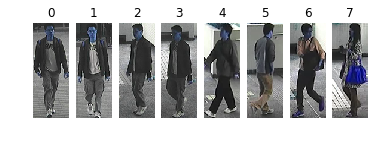

[0.9998386, 0.9996513, 0.99955064, 0.99946576, 0.99378115, 0.871022, 0.78190947, 0.580045]


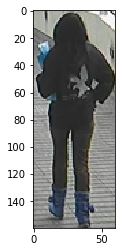

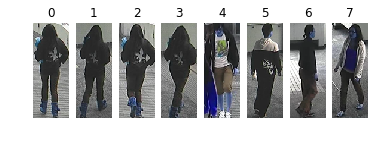

[0.9996132, 0.9994286, 0.9988733, 0.99879044, 0.8470464, 0.65121156, 0.27025196, 0.20329595]


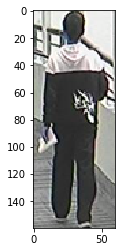

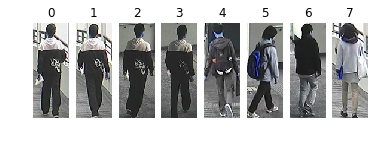

In [ ]:
data_x_size = 160
data_y_size = 60
list_len = len(p_list)
test_dataset = []
#--- 같은 사람들 묶음

saved_name = p_list[0][:4]
front = 0
back = 0
for index, img_name in enumerate(p_list):
    if img_name[:4] == saved_name:
        continue
    
    saved_name = img_name[:4]
    back = index
    if back-front <= 3:
        continue
        
    test_dataset.append(front)
    test_dataset.extend(random.sample(range(front+1,back),3))
    test_dataset.extend(random.sample(range(back,list_len+1),4))
    front = index
    
for i in range(8,8000,8):
    rank = []
    rank_index = []
    img = np.empty((8, data_x_size, data_y_size, 3),dtype=int)
    
    for j in range(i-8,i):
        img[j%8,:,:,:] = cv2.imread(test_path_dir+'/'+p_list[test_dataset[j]],cv2.IMREAD_COLOR)
        answer = sess.run(tf.sigmoid(model),feed_dict={X1:img[0].reshape(-1,data_x_size,data_y_size,3),
                                                       X2:img[j%8].reshape(-1,data_x_size,data_y_size,3)})
        rank.append(answer[0][1])
    rank_index = sorted(range(len(rank)), key=lambda k: rank[k])
    rank.sort(reverse = True) 
    print(rank)
    plt.imshow(img[0])
    plt.show()
    fig , ax = plt.subplots(1, 8)
    for j in range(8):
        ax[j].set_axis_off()
        ax[j].imshow(img[rank_index[7-j]])
        ax[j].set_title(j)
    plt.show()
    plt.close(fig)
    

In [ ]:
#test_size = len(data1)
test_size = 11

data_x_size = 160
data_y_size = 60

for i in range(test_size):
    test_img1 = np.empty((1, data_x_size, data_y_size,3))
    test_img2 = np.empty((1, data_x_size, data_y_size,3))
    
    test_img1[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/'+str(i+1)+'.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    #test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    
    test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
    test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_img1, X2:test_img2,})
    print(answer)
    
    img1 = cv2.imread('/home/esdl/tensorflow/test_data/1.jpg',cv2.IMREAD_COLOR)
    img2 = cv2.imread('/home/esdl/tensorflow/test_data/'+str(i+1)+'.jpg',cv2.IMREAD_COLOR)
    #img2 = cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR)
    
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
    else:
        print("NN answer is = Different")
    plt.show()
    plt.close(fig)

In [ ]:
#test_size = len(data1)
test_size = 11

data_x_size = 160
data_y_size = 60

for i in range(test_size):
    test_img1 = np.empty((1, data_x_size, data_y_size,3))
    test_img2 = np.empty((1, data_x_size, data_y_size,3))
    
    test_img1[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/24.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/24_'+str(i+1)+'.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    #test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    
    test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
    test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_img1, X2:test_img2,})
    print(answer)
    
    img1 = cv2.imread('/home/esdl/tensorflow/test_data/24.jpg',cv2.IMREAD_COLOR)
    img2 = cv2.imread('/home/esdl/tensorflow/test_data/24_'+str(i+1)+'.jpg',cv2.IMREAD_COLOR)
    #img2 = cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR)
    
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
    else:
        print("NN answer is = Different")
    plt.show()
    plt.close(fig)

In [ ]:
#test_size = len(data1)
test_size = 1

data_x_size = 160
data_y_size = 60

for i in range(test_size):
    test_img1 = np.empty((1, data_x_size, data_y_size,3))
    test_img2 = np.empty((1, data_x_size, data_y_size,3))
    
    test_img1[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/26_1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    #test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/27_1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    
    test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
    test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_img1, X2:test_img2,})
    print(answer)
    
    img1 = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/26_1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    #img2 = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/27_1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    img2 = cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR)
    
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
    else:
        print("NN answer is = Different")
    plt.show()
    plt.close(fig)

In [ ]:
#faceTest!
#test_size = len(data1)
test_size = 1

data_x_size = 160
data_y_size = 60

for i in range(test_size):
    test_img1 = np.empty((1, data_x_size, data_y_size,3))
    test_img2 = np.empty((1, data_x_size, data_y_size,3))
    
    test_img1[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/aderdeen/andrew1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    #test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/27_1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/aderdeen/caroline1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    
    test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
    test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_img1, X2:test_img2,})
    print(answer)
    
    img1 = cv2.imread('/home/esdl/tensorflow/aderdeen/andrew1.jpg',cv2.IMREAD_COLOR)
    #img2 = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/27_1.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    img2 = cv2.imread('/home/esdl/tensorflow/aderdeen/caroline1.jpg',cv2.IMREAD_COLOR)
    
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
    else:
        print("NN answer is = Different")
    plt.show()
    plt.close(fig)

In [ ]:
#test_size = len(data1)
test_size = 14


data_x_size = 160
data_y_size = 60

for i in range(test_size):
    test_img1 = np.empty((1, data_x_size, data_y_size,3))
    test_img2 = np.empty((1, data_x_size, data_y_size,3))
    
    test_img1[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/DS/8.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/DS/'+str(i+1)+'.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    #test_img2[0,:,:,:] = cv2.resize(cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    
    test_img1 = test_img1.reshape(-1,data_x_size,data_y_size,3)
    test_img2 = test_img2.reshape(-1,data_x_size,data_y_size,3)
    answer = sess.run(tf.nn.softmax(model),feed_dict={X1:test_img1, X2:test_img2,})
    print(answer)
    
    img1 = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/DS/8.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size)) 
    img2 = cv2.resize(cv2.imread('/home/esdl/tensorflow/test_data/DS/'+str(i+1)+'.jpg',cv2.IMREAD_COLOR), (data_y_size, data_x_size))
    #img2 = cv2.imread('/home/esdl/tensorflow/campus/0030001.png',cv2.IMREAD_COLOR)
    
    fig , ax = plt.subplots(1, 2)
    ax[0].set_axis_off()
    ax[1].set_axis_off()

    ax[0].imshow(img1)
    ax[1].imshow(img2)
    
    if answer[0,0] < answer[0,1]:
        print("NN answer is = SAME")
    else:
        print("NN answer is = Different")
    plt.show()
    plt.close(fig)

In [ ]:
sess.close()

# --------------테스트 구역입니다--------------!--------------테스트 구역입니다--------------

In [ ]:
test1 = tf.constant([[[1,2,3],[4,5,6],[7,8,9]],[[1,2,3],[4,5,6],[7,8,9]]],dtype=tf.float32)
test2 = tf.constant([[[5,5,5],[3,3,3],[1,1,1]],[[5,5,5],[3,3,3],[1,1,1]]],dtype=tf.float32)

stride = 3
# padding stride 미적용 일단 3으로 할 것
paddings = tf.constant([[0, 0], [1, 1], [1, 1]])
test3 = tf.pad(test2, paddings, "CONSTANT")

for i in range(test1.shape[1]):
    test5 = tf.subtract(tf.reshape(test1[:,i,0],[test1.shape[0],1,1]),test3[:,i:i+stride,:stride])
    for j in range(test1.shape[2]):
        if j == 0: continue
        test4 = tf.subtract(tf.reshape(test1[:,i,j],[test1.shape[0],1,1]),test3[:,i:i+stride,j:j+stride])
        test5 = tf.concat([test5,test4],2)
    if i==0:
        test6 = test5
        continue
    test6 = tf.concat([test6,test5],1)

print(test2.shape,test3.shape)
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    print(sess.run(test1))
    print(sess.run(test3))
    print(sess.run(test6))
    print(sess.run(tf.shape(test6)))
    #print(sess.run(tf.reshape(test1[:,i,0],[2,1,1])))
    #print(sess.run(test3[:,i:i+3,:3]))
    #print(sess.run(tf.subtract(tf.reshape(test1[:,i,0],[2,1,1]),test3[:,i:i+3,:3])))

In [ ]:
test1 = tf.constant([[[[1,2,3],[4,5,6],[7,8,9]],[[1,2,3],[4,5,6],[7,8,9]]],[[[1,2,3],[4,5,6],[7,8,9]],[[1,2,3],[4,5,6],[7,8,9]]]],dtype=tf.float32)
test2 = tf.constant([[[[5,5,5],[3,3,3],[1,1,1]],[[5,5,5],[3,3,3],[1,1,1]]],[[[5,5,5],[3,3,3],[1,1,1]],[[5,5,5],[3,3,3],[1,1,1]]]],dtype=tf.float32)
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    print(sess.run(CrossND(test1,test2)))

In [ ]:
test1 = tf.constant([[[[1,2,3],[4,5,6],[7,8,9]],[[1,2,3],[4,5,6],[7,8,9]]],[[[1,2,3],[4,5,6],[7,8,9]],[[1,2,3],[4,5,6],[7,8,9]]]],dtype=tf.float32)
test2 = tf.transpose(test1,[0,3,1,2])

print(test1.shape)
print(test2.shape)
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    print(sess.run(test1))
    print(sess.run(test2))

In [ ]:
X1 = tf.placeholder(tf.float32, [None, 128, 64, 3])
X2 = tf.placeholder(tf.float32, [None, 128, 64, 3])
Y = tf.placeholder(tf.float32, [None, 2])
keep_prob = tf.placeholder(tf.float32)

#-----------------------------------------------------
W1 = tf.Variable(tf.random_normal([10,10,3,64], stddev = 0.01))
W2 = tf.Variable(tf.random_normal([7,7,64,128], stddev = 0.01))
W3 = tf.Variable(tf.random_normal([4,4,128,128], stddev = 0.01))
W4 = tf.Variable(tf.random_normal([4,4,128,256], stddev = 0.01))
b1 = tf.Variable(tf.random_normal([1,1,64], mean = 0.5, stddev = 0.01))
b2 = tf.Variable(tf.random_normal([1,1,128], mean = 0.5, stddev = 0.01))
b3 = tf.Variable(tf.random_normal([1,1,128], mean = 0.5, stddev = 0.01))
b4 = tf.Variable(tf.random_normal([1,1,256], mean = 0.5, stddev = 0.01))

L1_1 = tf.nn.conv2d(X1,W1,strides=[1,1,1,1],padding='SAME')
L1_1 = tf.add(L1_1,b1)
L1_1 = tf.nn.relu(L1_1)
L1_1 = tf.nn.max_pool(L1_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L1_2 = tf.nn.conv2d(X2,W1,strides=[1,1,1,1],padding='SAME')
L1_2 = tf.add(L1_2,b1)
L1_2 = tf.nn.relu(L1_2)
L1_2 = tf.nn.max_pool(L1_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L2_1 = tf.nn.conv2d(L1_1,W2,strides=[1,1,1,1],padding='SAME')
L2_1 = tf.add(L2_1,b2)
L2_1 = tf.nn.relu(L2_1)
L2_1 = tf.nn.max_pool(L2_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L2_2 = tf.nn.conv2d(L1_2,W2,strides=[1,1,1,1],padding='SAME')
L2_2 = tf.add(L2_2,b2)
L2_2 = tf.nn.relu(L2_2)
L2_2 = tf.nn.max_pool(L2_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L3_1 = tf.nn.conv2d(L2_1,W3,strides=[1,1,1,1],padding='SAME')
L3_1 = tf.add(L3_1,b3)
L3_1 = tf.nn.relu(L3_1)
L3_1 = tf.nn.max_pool(L3_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L3_2 = tf.nn.conv2d(L2_2,W3,strides=[1,1,1,1],padding='SAME')
L3_2 = tf.add(L3_2,b3)
L3_2 = tf.nn.relu(L3_2)
L3_2 = tf.nn.max_pool(L3_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L4_1 = tf.nn.conv2d(L3_1,W4,strides=[1,1,1,1],padding='SAME')
L4_1 = tf.add(L4_1,b4)
L4_1 = tf.nn.relu(L4_1)
L4_1 = tf.nn.max_pool(L4_1, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')

L4_2 = tf.nn.conv2d(L3_2,W4,strides=[1,1,1,1],padding='SAME')
L4_2 = tf.add(L4_2,b4)
L4_2 = tf.nn.relu(L4_2)
L4_2 = tf.nn.max_pool(L4_2, ksize=[1,2,2,1], strides=[1,2,2,1], padding = 'SAME')
#-----------------------------------------------------

W5 = tf.Variable(tf.random_normal([8*4*256,4096], stddev = 0.2))
b5 = tf.Variable(tf.random_normal([4096], mean = 0.5, stddev = 0.01))

A1 = tf.Variable(tf.random_normal([4096], stddev = 0.01))

W6 = tf.Variable(tf.random_normal([4096,1], stddev = 0.2))
b6 = tf.Variable(tf.random_normal([1], mean = 0.5, stddev = 0.01))

L3_1 = tf.reshape(L4_1, [-1,8*4*256])
L3_1 = tf.add(tf.matmul(L3_1,W5),b5)
L3_1 = tf.nn.sigmoid(L3_1)

L3_2 = tf.reshape(L4_2, [-1,8*4*256])
L3_2 = tf.add(tf.matmul(L3_2,W5),b5)
L3_2 = tf.nn.sigmoid(L3_2)

L3 = tf.abs(tf.subtract(L3_1,L3_2))
L3 = tf.multiply(A1,L3)
L3 = tf.nn.sigmoid(L3)
L3 = tf.nn.dropout(L3, keep_prob)

model= tf.add(tf.matmul(L3,W6),b6)
#model = tf.reduce_sum(L3,axis=1,keep_dims=True)
#-----------------------------------------------------

batch_size=50
total_batch=int(len(data_index) / batch_size)
print("전체 데이터 크기는",len(data_index),"배치 크기는",batch_size,"전체 배치는",total_batch)

#cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=Y, logits=model))
cost = tf.reduce_mean(tf.keras.backend.binary_crossentropy(target=Y, output=tf.nn.sigmoid(model)))
#cost = tf.reduce_mean(Y*tf.log(model)+(1-Y)*tf.log(model))

global_step = tf.Variable(0, trainable=False)
starter_learning_rate = 0.00006
#learning_rate = starter_learning_rate
learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step,
                                           total_batch, 0.99, staircase=True)

# optimizer = tf.train.AdamOptimizer(0.00006).minimize(cost)
# optimizer = tf.train.GradientDescentOptimizer(learning_rate = 0.00006).minimize(cost)
optimizer = tf.train.RMSPropOptimizer(starter_learning_rate,momentum=0.5).minimize(cost,global_step=global_step)

init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)



for epoch in range(500):
    total_cost=0
    index_num=0
    for i in range(total_batch):
        
        input_data1 = np.empty((batch_size, 128, 64, 3))
        input_data2 = np.empty((batch_size, 128, 64, 3))
        batch_i=0
        for index_num in data_index[i*batch_size:(i+1)*batch_size]:
            input_data1[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[index_num]],cv2.IMREAD_COLOR)
            input_data2[batch_i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[index_num]],cv2.IMREAD_COLOR)
            batch_i=batch_i+1
        batch_xs1 = input_data1
        batch_xs1 = batch_xs1.reshape(-1,128,64,3)
        batch_xs2 = input_data2
        batch_xs2 = batch_xs2.reshape(-1,128,64,3)
        batch_ys = CoN[i*batch_size : (i+1)*batch_size]
        batch_ys = batch_ys.reshape(-1,1)
        _, cost_val, lr=sess.run([optimizer, cost, learning_rate], feed_dict={X1:batch_xs1, X2:batch_xs2, Y:batch_ys, keep_prob:1})
        total_cost += cost_val
    print('Epoch:', '%04d' % (epoch + 1), 'Avg.cost=', '{:.3f}'.format(total_cost / total_batch) , 'learning rate =','{:.8f}'.format(lr))
    
    is_correct=tf.equal(tf.cast(model>tf.constant(0.5),tf.float32),Y)
    accuracy=tf.reduce_mean(tf.cast(is_correct, tf.float32))
    test_data1 = np.empty((len(data1), 128, 64,3))
    test_data2 = np.empty((len(data1), 128, 64,3))
    for i in range(len(data1)):
        test_data1[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
        test_data2[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)

    test_data1 = test_data1.reshape(-1,128,64,3)
    test_data2 = test_data2.reshape(-1,128,64,3)
    ac = sess.run(accuracy, feed_dict={X1:test_data1,
                                            X2:test_data2,
                                            Y:CoN[data_index[:len(data1)]].reshape(-1,1),
                                            keep_prob: 1})
    print('정확도:', ac)


    
print('Optimized!')

"""
is_correct=tf.equal(int(model>0.5),Y)
accuracy=tf.reduce_mean(tf.cast(is_correct, tf.float32))
test_data1 = np.empty((list_len, 128, 64,3))
test_data2 = np.empty((list_len, 128, 64,3))
for i in range(list_len):
    test_data1[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data1[i]],cv2.IMREAD_COLOR)
    test_data2[i,:,:,:] = cv2.imread(path_dir+'/'+file_list[data2[i]],cv2.IMREAD_COLOR)

test_data1 = test_data1.reshape(-1,128,64,3)
test_data2 = test_data2.reshape(-1,128,64,3)
print('정확도:', sess.run(accuracy, feed_dict={X1:test_data1,
                                            X2:test_data2,
                                           Y:CoN[data_index[:list_len]].reshape(-1,1),
                                           keep_prob: 1}))
"""

# sess.close()